In [5]:
import sys
sys.path.append('../../')

from os import listdir

from hdf5storage import loadmat, savemat 
import numpy as np 
from matplotlib import pyplot as plt

from scipy import signal 
from hnlpy.timeop import makefiltersos
from hnlpy.timeop import narrowfilter 
from scipy.signal import sosfiltfilt
from scipy.signal import hilbert
from scipy.signal import savgol_filter
from scipy.stats import sem
from scipy.stats import f_oneway

from scipy import stats
rng = np.random.default_rng()

from numpy.polynomial.polynomial import polyfit, polyval

import networkx as nx

In [6]:
# (Color Scheme) 
red         = [1, 0, 0]
pink        = [1, 0.65, 0.75]
black       = [0, 0, 0]
white       = [1, 1, 1]
blue        = [0, 0, 1]
mediumblue  = [0, 0.4, 0.7]
green       = [0, 1, 0]
darkgreen   = [0, 0.5, 0]
grey        = [0.5, 0.5, 0.5]
yellow      = [1, 1, 0]
deepyellow  = [1, 0.8, 0.2]
gold        = [212/255, 175/255, 55/255]
brown       = [150/255, 75/255, 0]
magenta     = [1, 0, 1] 
cyan        = [0, 1, 1]  
purple      = [0.6, 0.1, 0.9]

# % https://www.mathworks.com/help/matlab/creating_plots/specify-plot-colors.html
matlab_blue     = [0, 0.4470, 0.7410]
matlab_orange   = [0.8500, 0.3250, 0.0980]
matlab_gold     = [0.9290, 0.6940, 0.1250]
matlab_purple   = [0.4940, 0.1840, 0.5560]
matlab_green    = [0.4660, 0.6740, 0.1880]
matlab_cyan     = [0.3010, 0.7450, 0.9330]
matlab_red      = [0.6350, 0.0780, 0.1840]

# combine colors
condicolors = [darkgreen, red, blue, magenta, purple, purple]
dire3colors = [darkgreen, brown, magenta]
syn2colors = [darkgreen, pink]
HNLcolors = [darkgreen, deepyellow, pink]


Try comparing sampling rate of 200 and 125 in one session and comparing DFA 5/5 vs 20/20

In [ ]:
# load Hurst from 20/20 DFA 
# General: a single model for all
outdict = loadmat('Hurst_eeg_20_20220713.mat')
eeg_Hurst           = outdict['eeg_Hurst']        
new_sr              = outdict['new_sr']           
passbands           = outdict['passbands']        
stopbands           = outdict['stopbands']        
band_labels         = outdict['band_labels']      
filename            = outdict['filename']         
condition_index     = outdict['condition_index']  
condition_names     = outdict['condition_names']  
channels            = outdict['channels']         
channel_labels      = outdict['channel_labels']   
intervals           = outdict['intervals']        
samples             = outdict['samples']          
sessionTypes        = outdict['sessionTypes']     
session             = outdict['session']        


In [ ]:
eeg_Hurst_20=eeg_Hurst

In [ ]:
  # load Hurst 125
# General: a single model for all
outdict = loadmat('Hurst_eeg_125_20220713.mat')
eeg_Hurst           = outdict['eeg_Hurst']        
new_sr              = outdict['new_sr']           
passbands           = outdict['passbands']        
stopbands           = outdict['stopbands']        
band_labels         = outdict['band_labels']      
filename            = outdict['filename']         
condition_index     = outdict['condition_index']  
condition_names     = outdict['condition_names']  
channels            = outdict['channels']         
channel_labels      = outdict['channel_labels']   
intervals           = outdict['intervals']        
samples             = outdict['samples']          
sessionTypes        = outdict['sessionTypes']     
session             = outdict['session']        

In [ ]:
eeg_Hurst_125=eeg_Hurst

In [ ]:
  # load Hurst 200
# General: a single model for all
outdict = loadmat('Hurst_eeg_125_20220713.mat')
eeg_Hurst           = outdict['eeg_Hurst']        
new_sr              = outdict['new_sr']           
passbands           = outdict['passbands']        
stopbands           = outdict['stopbands']        
band_labels         = outdict['band_labels']      
filename            = outdict['filename']         
condition_index     = outdict['condition_index']  
condition_names     = outdict['condition_names']  
channels            = outdict['channels']         
channel_labels      = outdict['channel_labels']   
intervals           = outdict['intervals']        
samples             = outdict['samples']          
sessionTypes        = outdict['sessionTypes']     
session             = outdict['session']        

In [ ]:
eeg_Hurst_200=eeg_Hurst

In [ ]:
# compare Hurst 200 5/5 and Hurst 125 5/5
mean_H_200_5=np.zeros((4,2,7,32))
mean_H_125_5=np.zeros((4,2,7,32))
for condi in range(4):
    for subj in range(2):
        mean_H_200_5[condi,subj,:,:]=np.mean(np.squeeze(eeg_Hurst_200[np.where(np.array(condition_index)==condi),subj,:,:]),axis=0)
        mean_H_125_5[condi,subj,:,:]=np.mean(np.squeeze(eeg_Hurst_125[np.where(np.array(condition_index)==condi),subj,:,:]),axis=0)

In [ ]:
# plot the comparison
for subj in range(2):
    fig, ax = plt.subplots(2,4,figsize=(6*4, 4))
    for condi in range(4):
        compare1=plt.sca(ax[0,condi])
        plt.imshow(mean_H_200_5[condi,subj,:,:],vmin=0.5,vmax=1,cmap=plt.cm.jet)
        plt.xlabel('channels'); plt.ylabel('frequency')
        plt.title('mean Hurst Sr200: subj '+str(subj)+' condi '+str(condi))
        plt.sca(ax[1,condi])
        compare2=plt.imshow(mean_H_125_5[condi,subj,:,:],vmin=0.5,vmax=1,cmap=plt.cm.jet)
        plt.xlabel('channels'); plt.ylabel('frequency')
        plt.title('mean Hurst Sr125: subj '+str(subj)+' condi '+str(condi))
        
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])

    cbar_node=fig.colorbar(compare2,cbar_ax)
    cbar_node.ax.tick_params(labelsize=10)
    cbar_node.set_label('Hurst')


In [ ]:
# compare Hurst 200 5/5 and Hurst 200 20/20
mean_H_200_5=np.zeros((4,2,7,32))
mean_H_200_20=np.zeros((4,2,7,32))
for condi in range(4):
    for subj in range(2):
        mean_H_200_5[condi,subj,:,:]=np.mean(np.squeeze(eeg_Hurst_200[np.where(np.array(condition_index)==condi),subj,:,:]),axis=0)
        mean_H_200_20[condi,subj,:,:]=np.mean(np.squeeze(eeg_Hurst_20[np.where(np.array(condition_index)==condi),subj,:,:]),axis=0)

In [ ]:
# plot the comparison
for subj in range(2):
    fig, ax = plt.subplots(2,4,figsize=(6*4, 4))
    for condi in range(4):
        plt.sca(ax[0,condi])
        plt.imshow(mean_H_200_5[condi,subj,:,:],vmin=0.5,vmax=1,cmap='jet')
        plt.xlabel('channels'); plt.ylabel('frequency')
        plt.title('mean Hurst DFA 5/5 Sr200: subj '+str(subj)+' condi '+str(condi))
        plt.sca(ax[1,condi])
        compare2=plt.imshow(mean_H_200_20[condi,subj,:,:],vmin=0.5,vmax=1,cmap='jet')
        plt.xlabel('channels'); plt.ylabel('frequency')
        plt.title('mean Hurst DFA 20/20 Sr200: subj '+str(subj)+' condi '+str(condi))

    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])

    cbar_node=fig.colorbar(compare2,cbar_ax)
    cbar_node.ax.tick_params(labelsize=10)
    cbar_node.set_label('Hurst')

Comparing with time sequence and state index in 12 sessions

In [9]:
# organize file in time sequence
# filedir="../../"
# pathname = 'Cleaned_data/'
filedates=[20220713,20220721,20220804,20220808,20220810,20220811,20220815,20220816,20221003,2022100401,2022100402,20221005]
numSes=len(filedates)

comparing Hurst_eeg

In [ ]:
# test in one file
ses=0
outdict = loadmat('Hurst_eeg_20_'+str(filedates[ses])+'.mat')
eeg_Hurst           = outdict['eeg_Hurst']          # 12x2x7x32
new_sr              = outdict['new_sr']             
passbands           = outdict['passbands']          
stopbands           = outdict['stopbands']          
band_labels         = outdict['band_labels']        
filename            = outdict['filename']           
condition_index     = outdict['condition_index']    # 12
condition_names     = outdict['condition_names']    
channels            = outdict['channels']           
channel_labels      = outdict['channel_labels']     
intervals           = outdict['intervals']          # 12x175x2
samples             = outdict['samples']            # 12x175x2
sessionTypes        = outdict['sessionTypes']       
session             = outdict['session']            # 12

In [5]:
outdict.keys()

dict_keys(['band_labels', 'channel_labels', 'channels', 'condition_names', 'eeg_Hurst', 'filename', 'intervals', 'samples', 'session', 'sessionTypes'])

In [ ]:
# put everything in 144 first dimenstion 
eeg_Hurst144x2       =np.zeros((144,2,7,32))
condition_index144   =np.zeros((144))
intervals144         =dict()
samples144           =dict()
session144           =np.zeros((144))
n=0
for ses in range(12):
    outdict = loadmat('Hurst_eeg_20_'+str(filedates[ses])+'.mat')
    eeg_Hurst           = outdict['eeg_Hurst']          # 12x2x7x32
    condition_index     = outdict['condition_index']    # 12
    intervals           = outdict['intervals']          # 12x175x2
    samples             = outdict['samples']            # 12x175x2
    session             = outdict['session']            # 12
    for trl in range(12):
        condition_index144[n]     = condition_index[trl]    # 12
        intervals144[str(n)]      = intervals[trl]
        samples144[str(n)]        = samples[trl]
        session144[n]             = session[trl]
        for subj in range(2):
            eeg_Hurst144x2[n,subj]       = eeg_Hurst[trl,subj,:,:]
        n+=1

outdict = dict()
outdict['eeg_Hurst144x2']       = eeg_Hurst144x2
outdict['condition_index144']   = condition_index144
outdict['intervals144']         = intervals144
outdict['samples144']           = samples144
outdict['session144']           = session144
savemat('Hurst_eeg144',outdict,store_python_metadata = True) 

# takes 18 s


In [12]:
outdict=loadmat('Hurst_eeg144.mat')
eeg_Hurst144x2      = outdict['eeg_Hurst144x2']       
condition_index144  = outdict['condition_index144']   
intervals144        = outdict['intervals144']         
samples144          = outdict['samples144']           
session144          = outdict['session144']           

In [14]:
synch_ind=np.where(session144==1)
synco_ind=np.where(session144==2)

Uncoupled_ind=np.where(condition_index144==0)
L_lead_ind   =np.where(condition_index144==1)
R_lead_ind   =np.where(condition_index144==2)
Mutual_ind   =np.where(condition_index144==3)
# print(Uncoupled_ind)
# print(L_lead_ind)
# print(R_lead_ind)
# print(Mutual_ind)

# Uncoupled condition in Synch for L&R
Uncoupled_synch_ind=np.intersect1d(synch_ind,Uncoupled_ind)
# Uncoupled condition in Synco for L&R
Uncoupled_synco_ind=np.intersect1d(synco_ind,Uncoupled_ind)


# L_Leading in Synch / R_following in Synch
L_lead_synch_ind=np.intersect1d(synch_ind,L_lead_ind)
# R_leading in Synch / L_following in Synch
R_lead_synch_ind=np.intersect1d(synch_ind,R_lead_ind)
# L_Leading in Synco / R_following in Synco
L_lead_synco_ind=np.intersect1d(synco_ind,L_lead_ind)
# R_leading in Synco / L_following in Synco
R_lead_synco_ind=np.intersect1d(synco_ind,R_lead_ind)


# Mutual condition in Synch for L&R
Mutual_synch_ind=np.intersect1d(synch_ind,Mutual_ind)
# Mutual condition in Synco for L&R
Mutual_synco_ind=np.intersect1d(synco_ind,Mutual_ind)

# parameters for plotting
states4names=['Uncoupled','Leading','Following','Mutual']
syn2names=['Synch','Synco']
states3names=['Independent','Unidirectional','Bidirectional']

color_4st=['green','red','blue','black']

In [ ]:
np.shape(np.mean(np.concatenate((eeg_Hurst144x2[Uncoupled_synch_ind,0,:,:], eeg_Hurst144x2[Uncoupled_synch_ind,1,:,:]),axis=0),axis=0))

In [15]:
# compute the mean
eeg_Hurst144x2 # 144x2x7x32 
eeg_H_mean=np.zeros((2,4,7,32)) # 2 syn types x 4 condi x 7 freq x 32 chan

# Uncoupled
Var00=np.concatenate((eeg_Hurst144x2[Uncoupled_synch_ind,0,:,:], eeg_Hurst144x2[Uncoupled_synch_ind,1,:,:]),axis=0)
eeg_H_mean[0,0,:,:]=np.mean(Var00,axis=0)
Var10=np.concatenate((eeg_Hurst144x2[Uncoupled_synco_ind,0,:,:], eeg_Hurst144x2[Uncoupled_synco_ind,1,:,:]),axis=0)
eeg_H_mean[1,0,:,:]=np.mean(Var10,axis=0)

# Leading for L&R
Var01=np.concatenate((eeg_Hurst144x2[L_lead_synch_ind,0,:,:], eeg_Hurst144x2[R_lead_synch_ind,1,:,:]),axis=0)
eeg_H_mean[0,1,:,:]=np.mean(Var01,axis=0)
Var11=np.concatenate((eeg_Hurst144x2[L_lead_synco_ind,0,:,:], eeg_Hurst144x2[R_lead_synco_ind,1,:,:]),axis=0)
eeg_H_mean[1,1,:,:]=np.mean(Var11,axis=0)

# Following for L&R
Var02=np.concatenate((eeg_Hurst144x2[L_lead_synch_ind,1,:,:], eeg_Hurst144x2[R_lead_synch_ind,0,:,:]),axis=0)
eeg_H_mean[0,2,:,:]=np.mean(Var02,axis=0)
Var12=np.concatenate((eeg_Hurst144x2[L_lead_synco_ind,1,:,:], eeg_Hurst144x2[R_lead_synco_ind,0,:,:]),axis=0)
eeg_H_mean[1,2,:,:]=np.mean(Var12,axis=0)

# Mutual
Var03=np.concatenate((eeg_Hurst144x2[Mutual_synch_ind,0,:,:], eeg_Hurst144x2[Mutual_synch_ind,1,:,:]),axis=0)
eeg_H_mean[0,3,:,:]=np.mean(Var03,axis=0)
Var13=np.concatenate((eeg_Hurst144x2[Mutual_synco_ind,0,:,:], eeg_Hurst144x2[Mutual_synco_ind,1,:,:]),axis=0)
eeg_H_mean[1,3,:,:]=np.mean(Var13,axis=0)


In [16]:
# T-test between synch and synco
P_values=np.zeros((4,7,32))
Var_synch=[Var00,Var01,Var02,Var03]
Var_synco=[Var10,Var11,Var12,Var13]
Var_syn=[Var_synch, Var_synco]
for st in range(4):
    for freq in range(7):
        for chan in range(32):
            statistic, P_values[st,freq,chan] = stats.ttest_ind(Var_syn[0][st][:,freq,chan],Var_syn[1][st][:,freq,chan])


In [20]:
band_labels = ['Delta','Theta','Alpha','Mu','Beta1','Beta2','Gamma']

Text(0.5, 0.98, 'P_values from t test comparing EEG Hurst in 2 syn type ANOVA')

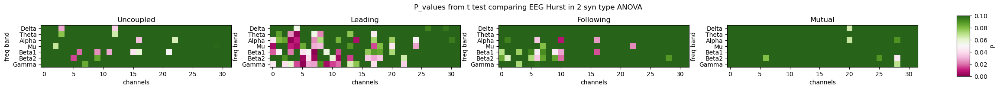

In [21]:
# plot the p values
fig, ax = plt.subplots(1,4,figsize=(30, 2))
for st in range(4):
    plt.sca(ax[st])
    compare1=plt.imshow(P_values[st,:,:],vmin=0,vmax=0.1,cmap=plt.cm.PiYG)
    plt.xlabel('channels'); plt.ylabel('freq band')
    plt.yticks(np.arange(7),band_labels,rotation=0)
    plt.title(states4names[st])
    
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
cbar_node=fig.colorbar(compare1,cbar_ax)
cbar_node.ax.tick_params(labelsize=10)
cbar_node.set_label('P')
plt.suptitle('P_values from t test comparing EEG Hurst in 2 syn type ANOVA')



In [22]:
# ANOVA
P_values=np.zeros((2,7,32))
for freq in range(7):
    for chan in range(32):
        statistic, P_values[0,freq,chan] = f_oneway(Var00[:,freq,chan],Var01[:,freq,chan],Var02[:,freq,chan],Var03[:,freq,chan])
        statistic, P_values[1,freq,chan] = f_oneway(Var10[:,freq,chan],Var11[:,freq,chan],Var12[:,freq,chan],Var13[:,freq,chan])


In [ ]:
freq=4; chan=20
print(Var13[:,freq,chan])
print(Var10[:,freq,chan])

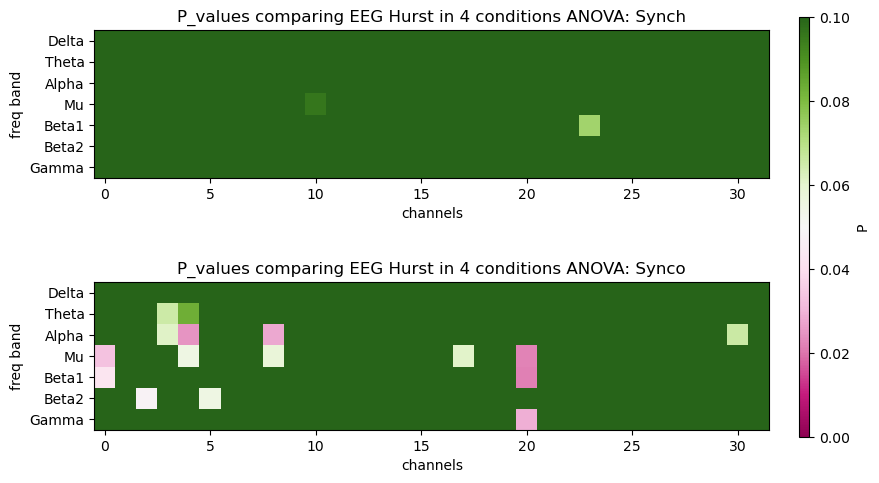

In [24]:
# plot the p values
fig, ax = plt.subplots(2,1,figsize=(10, 6))
for syn in range(2):
    plt.sca(ax[syn])
    compare1=plt.imshow(P_values[syn,:,:],vmin=0,vmax=0.1,cmap=plt.cm.PiYG)
    plt.xlabel('channels'); plt.ylabel('freq band')
    plt.yticks(np.arange(7),band_labels,rotation=0)
    plt.title('P_values comparing EEG Hurst in 4 conditions ANOVA: '+syn2names[syn])
    
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
cbar_node=fig.colorbar(compare1,cbar_ax)
cbar_node.ax.tick_params(labelsize=10)
cbar_node.set_label('P')

In [ ]:
channel_labels[8]

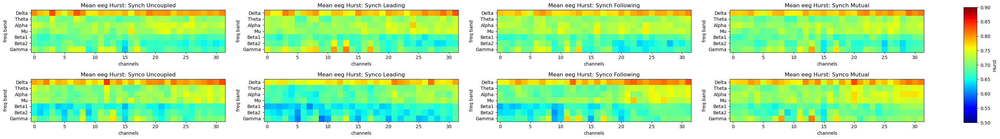

In [25]:
# plot 2 syn x 4 condi 
# (note "condition" of leading and following here is different from 
# "condition" of L-lead and R-lead in the experiment design)
fig, ax = plt.subplots(2,4,figsize=(10*4, 5))
for syn in range(2):
    for condi in range(4):
        plt.sca(ax[syn,condi])
        compare1=plt.imshow(eeg_H_mean[syn,condi,:,:],vmin=0.5,vmax=0.9,cmap=plt.cm.jet)
        plt.xlabel('channels'); plt.ylabel('freq band')
        plt.yticks(np.arange(7),band_labels,rotation=0)
        plt.title('Mean eeg Hurst: '+syn2names[syn]+' '+states4names[condi])
    
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
cbar_node=fig.colorbar(compare1,cbar_ax)
cbar_node.ax.tick_params(labelsize=10)
cbar_node.set_label('Hurst')

In [26]:
# load chan locs for topoplots
dict_loc=loadmat('../Pcorr_4states_2sestype/chan_locs/xyzlabels.mat')
x=dict_loc['x']
y=dict_loc['y']
z=dict_loc['z']
labels=dict_loc['labels']

# adjust coords for nilearn plots
coords=np.zeros((32,3))
for i in range(32):
    coords[i,:]=[x[i]*700, y[i]*900-15, z[i]*950-15]

#  construct text for networkx labels
labeldict = {}
for i in range(32):
    labeldict[i]=labels[i]

# load pos for networkx plots
pos_mat=loadmat('../Pcorr_4states_2sestype/chan_locs/pos.mat')
pos=pos_mat['pos']


# construct full edges_list
edges_list=list() # each edge is a two element tuple
for i in range(32):
    for j in range(32):
        if i<j: # use indicies to remove half of edges and colors and the diagonal
            edges_list.append((i,j))

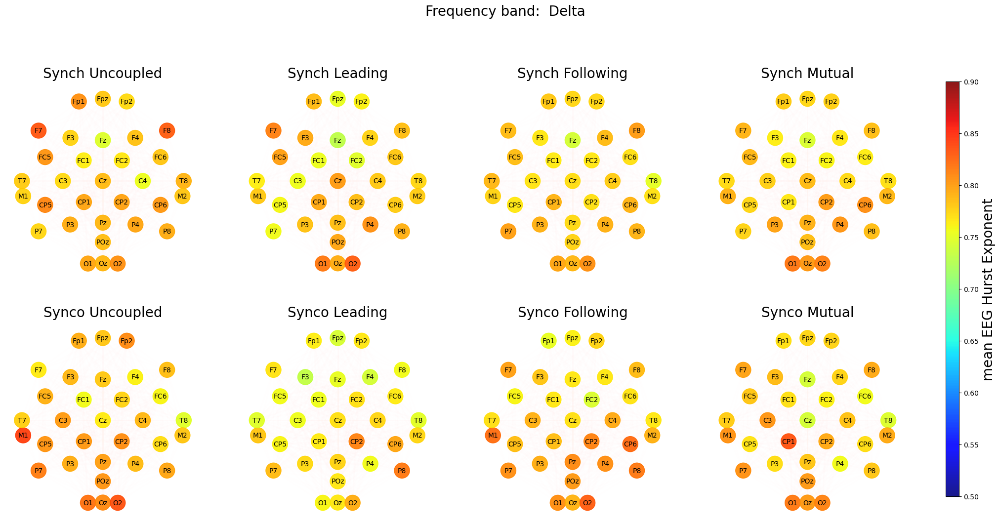

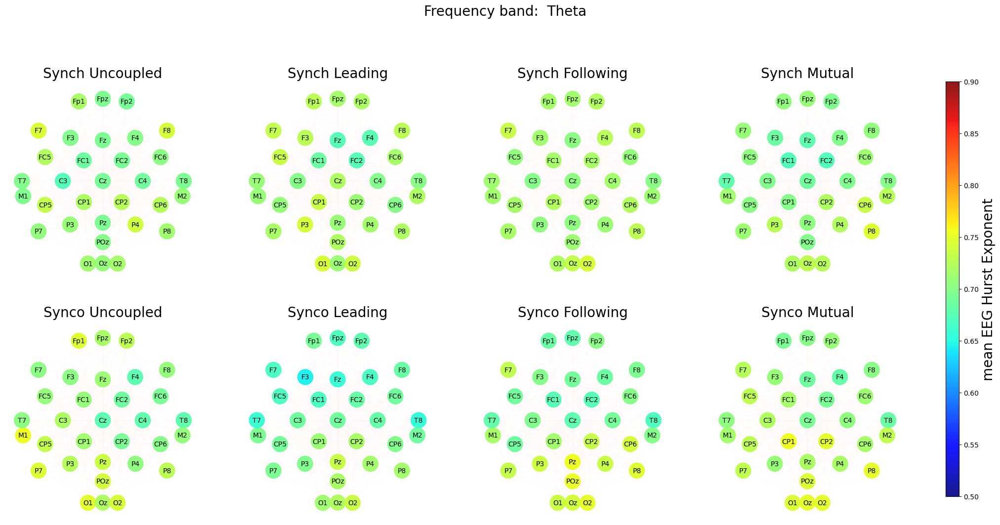

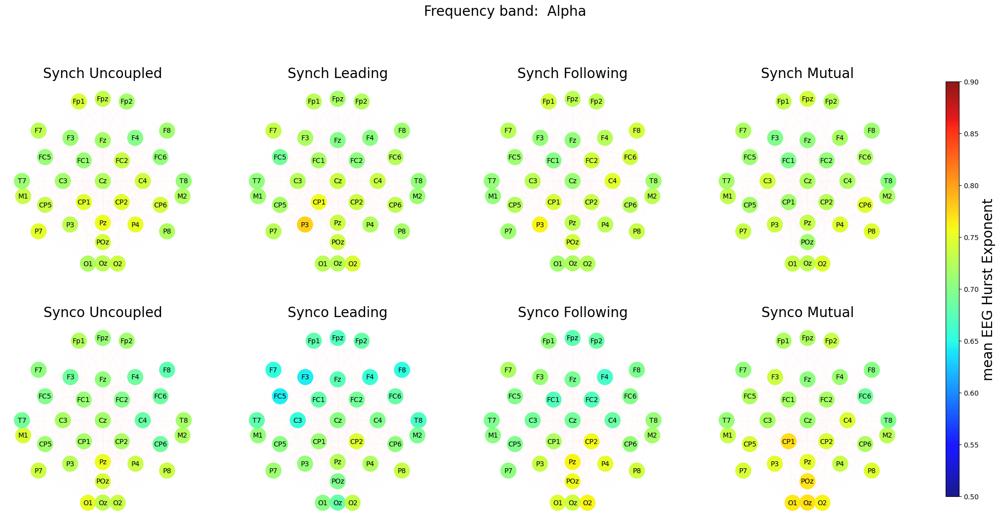

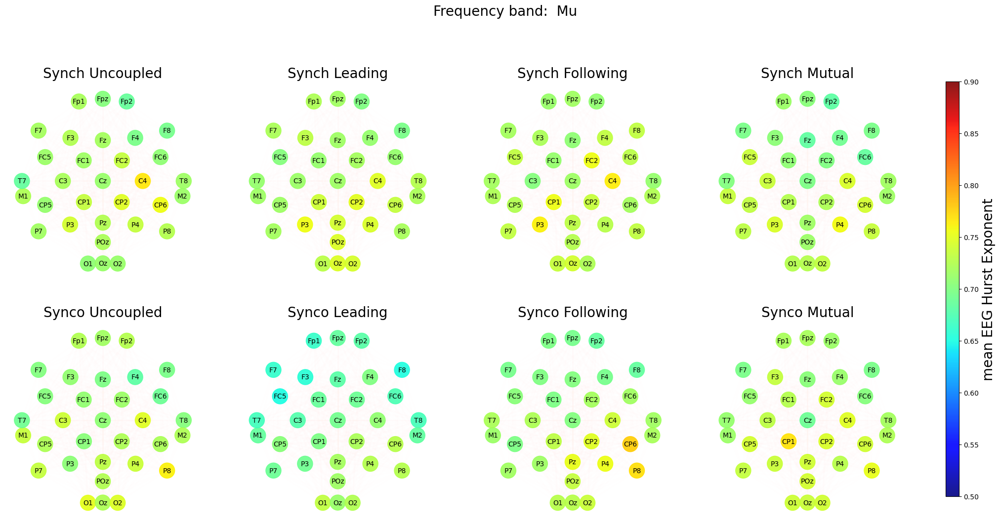

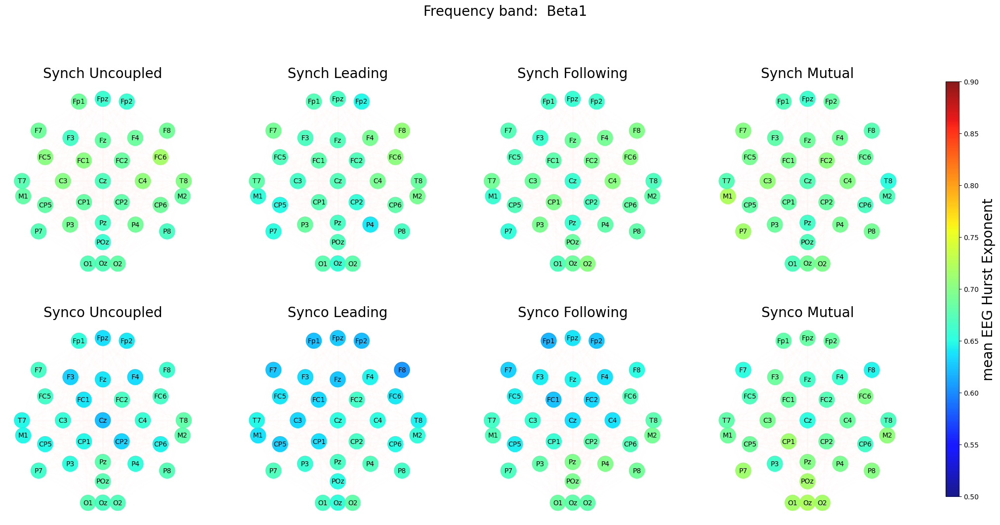

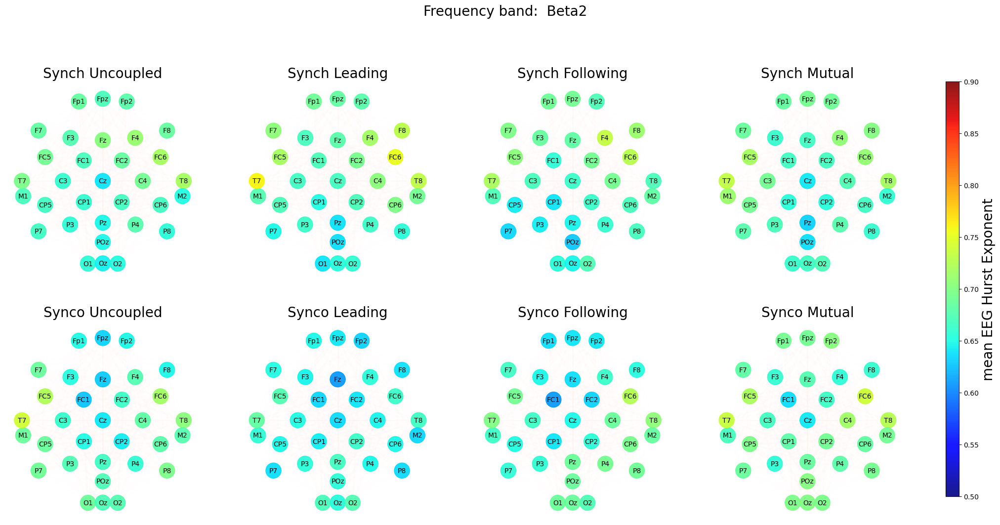

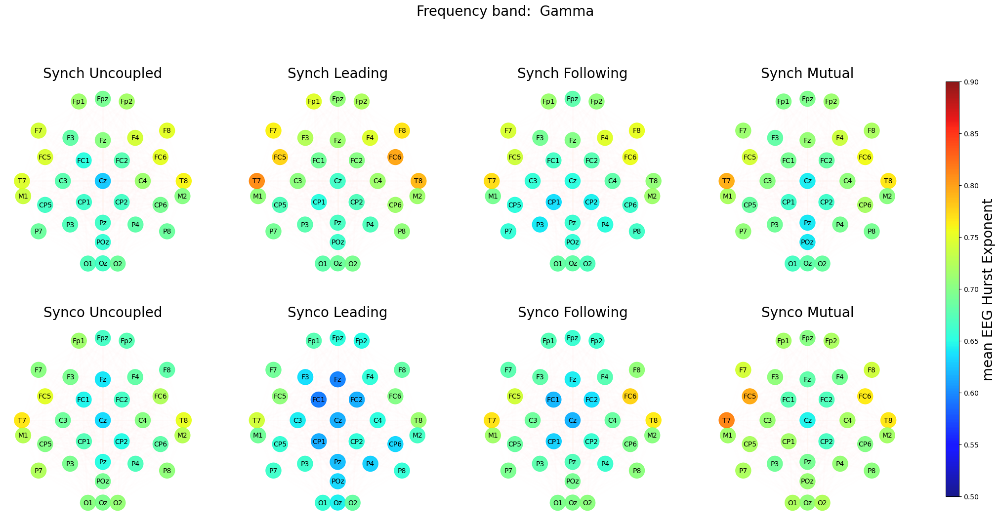

In [30]:
# Showing Hurst exponents
import networkx as nx
# select a freq band to investigate
for freq in range(7): # alpha and gamma
        fig, ax = plt.subplots(2,4,figsize=(6*4+3, 6*2))

        for syn in range(2):
                for condi in range(4):
                        non0_edges=list()
                        for i in range(len(edges_list)): # 496
                                non0_edges.append(edges_list[i]+({'weight': 0},))
                        # networkx initiate with edges
                        X = nx.Graph()
                        X.add_edges_from(non0_edges)
                        edges,non0_weights = zip(*nx.get_edge_attributes(X,'weight').items())

                        node_colors=eeg_H_mean[syn,condi,freq,:]

                        # set colorbar limits for node and edge from the 1st subplot
                        if syn==0 and condi ==0:
                                vmin_node_c=0.5 #min(node_colors)#+0.9*(max(node_colors)-min(node_colors))
                                vmax_node_c=0.9 # max(node_colors)#-0.45*(max(node_colors)-min(node_colors))
                                vmin_edge_c=0
                                vmax_edge_c=1
                        
                        # subplot
                        plt.sca(ax[syn, condi])

                        nx.draw_networkx_labels(X, pos, labels=labeldict, font_size=10)

                        nodes=nx.draw_networkx_nodes(X, pos, node_size=500, 
                                node_color=node_colors, vmin=vmin_node_c, vmax=vmax_node_c, 
                                cmap='jet', alpha=0.9)

                        edges=nx.draw_networkx_edges(X, pos, width=2, 
                                edge_color=non0_weights,edge_vmin=vmin_edge_c,edge_vmax=vmax_edge_c,
                                edge_cmap=plt.cm.Reds,alpha=0.01)
                        
                        ax[syn, condi].set_title(syn2names[syn] + ' ' + states4names[condi],
                                                fontsize = 20) 
                        ax[syn, condi].axis('off')


        fig.subplots_adjust(right=0.8)
        cbar_ax1 = fig.add_axes([0.83, 0.15, 0.01, 0.7])
        # cbar_ax2 = fig.add_axes([0.88, 0.15, 0.01, 0.7])

        cbar_node=fig.colorbar(nodes,cbar_ax1)
        cbar_node.ax.tick_params(labelsize=10)
        cbar_node.set_label('mean EEG Hurst Exponent',fontsize = 20)

        # cbar_edges=fig.colorbar(edges,cbar_ax2)
        # cbar_edges.ax.tick_params(labelsize=10)
        # cbar_edges.set_label('mean average pcorr re-estimated')

        fig.subplots_adjust(top=0.85)
        fig.suptitle('Frequency band:  '+band_labels[freq], fontsize = 20) 


In [31]:
# compute the correlation in 3 states
eeg_H_corrcoef=np.zeros((2,3,7,32)) # 2 syn types x 3 state x 7 freq x 32 chan

for freq in range(7):
    for chan in range(32):
        # Independent
        eeg_H_corrcoef[0,0,freq,chan]=np.corrcoef(eeg_Hurst144x2[Uncoupled_synch_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Uncoupled_synch_ind,1,freq,chan])[0,1]
        eeg_H_corrcoef[1,0,freq,chan]=np.corrcoef(eeg_Hurst144x2[Uncoupled_synco_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Uncoupled_synco_ind,1,freq,chan])[0,1]

        # Unidrecional (Leading vs Following)
        eeg_H_corrcoef[0,1,freq,chan]=np.corrcoef(np.concatenate((eeg_Hurst144x2[L_lead_synch_ind,0,freq,chan],\
                                                eeg_Hurst144x2[R_lead_synch_ind,1,freq,chan]),axis=0),\
                                                  np.concatenate((eeg_Hurst144x2[L_lead_synch_ind,1,freq,chan],\
                                                eeg_Hurst144x2[R_lead_synch_ind,0,freq,chan]),axis=0))[0,1]
        eeg_H_corrcoef[1,1,freq,chan]=np.corrcoef(np.concatenate((eeg_Hurst144x2[L_lead_synco_ind,0,freq,chan],\
                                                eeg_Hurst144x2[R_lead_synco_ind,1,freq,chan]),axis=0),\
                                                  np.concatenate((eeg_Hurst144x2[L_lead_synco_ind,1,freq,chan],\
                                                eeg_Hurst144x2[R_lead_synco_ind,0,freq,chan]),axis=0))[0,1]

        # Mutual
        eeg_H_corrcoef[0,2,freq,chan]=np.corrcoef(eeg_Hurst144x2[Mutual_synch_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Mutual_synch_ind,1,freq,chan])[0,1]
        eeg_H_corrcoef[1,2,freq,chan]=np.corrcoef(eeg_Hurst144x2[Mutual_synco_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Mutual_synco_ind,1,freq,chan])[0,1]



In [ ]:
freq=0
chan=20
plt.plot(eeg_Hurst144x2[Uncoupled_synch_ind,0,freq,chan],eeg_Hurst144x2[Uncoupled_synch_ind,1,freq,chan],'.')
print(np.corrcoef(eeg_Hurst144x2[Uncoupled_synch_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Uncoupled_synch_ind,1,freq,chan])[0,1])

In [ ]:
freq=0
chan=19
plt.plot(eeg_Hurst144x2[Uncoupled_synco_ind,0,freq,chan],eeg_Hurst144x2[Uncoupled_synco_ind,1,freq,chan],'.')
print(np.corrcoef(eeg_Hurst144x2[Uncoupled_synco_ind,0,freq,chan], \
                                                eeg_Hurst144x2[Uncoupled_synco_ind,1,freq,chan])[0,1])

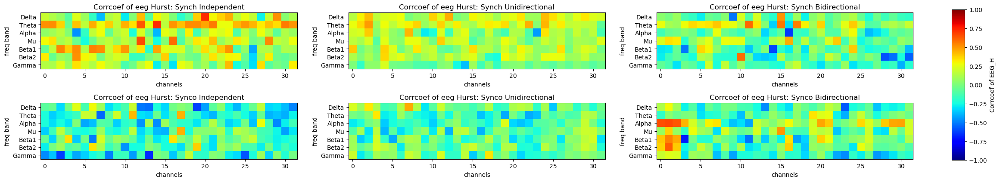

In [32]:
# plot 2 syn x 3 staes
# (note "condition" of leading and following here is different from 
# "condition" of L-lead and R-lead in the experiment design)
fig, ax = plt.subplots(2,3,figsize=(10*3, 5))
for syn in range(2):
    for st in range(3):
        plt.sca(ax[syn,st])
        compare1=plt.imshow(eeg_H_corrcoef[syn,st,:,:],vmin=-1,vmax=1,cmap=plt.cm.jet)
        plt.xlabel('channels'); plt.ylabel('freq band')
        plt.yticks(np.arange(7),band_labels,rotation=0)
        plt.title('Corrcoef of eeg Hurst: '+syn2names[syn]+' '+states3names[st])
    
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.83, 0.15, 0.01, 0.7])
cbar_node=fig.colorbar(compare1,cbar_ax)
cbar_node.ax.tick_params(labelsize=10)
cbar_node.set_label('Corrcoef of EEG_H')

comparing Correlation

In [ ]:
# test in one file 
ses=1
outdict = loadmat('Corr_eeg_200_'+str(filedates[ses])+'.mat')

eeg_empirical_correlation   =outdict['eeg_empirical_correlation']   # 12X2X7X32X32
eeg_partial_correlation     =outdict['eeg_partial_correlation']     # 12X2X7X32X32
new_sr                      =outdict['new_sr']                      
passbands                   =outdict['passbands']                   
stopbands                   =outdict['stopbands']                   
band_labels                 =outdict['band_labels']                 
filename                    =outdict['filename']                    
condition_index             =outdict['condition_index']             # 12
condition_names             =outdict['condition_names']             
channels                    =outdict['channels']                    
channel_labels              =outdict['channel_labels']              
intervals                   =outdict['intervals']                   # 12x175x2
samples                     =outdict['samples']                     # 12x175x2
sessionTypes                =outdict['sessionTypes']
session                     =outdict['session']                     # 12



In [ ]:
# put everything in 144 first dimenstion 
eeg_empirical_correlation144x2   =np.zeros((144,2,7,32,32))
eeg_partial_correlation144x2     =np.zeros((144,2,7,32,32))
condition_index144   =np.zeros((144))
intervals144         =dict()
samples144           =dict()
session144           =np.zeros((144))
n=0
for ses in range(12):
    outdict = loadmat('Corr_eeg_200_'+str(filedates[ses])+'.mat')
    eeg_empirical_correlation    = outdict['eeg_empirical_correlation']          # 12x2x7x32x32
    eeg_partial_correlation      = outdict['eeg_partial_correlation']            # 12x2x7x32x32
    condition_index     = outdict['condition_index']    # 12
    intervals           = outdict['intervals']          # 12x175x2
    samples             = outdict['samples']            # 12x175x2
    session             = outdict['session']            # 12
    for trl in range(12):
        condition_index144[n]     = condition_index[trl]    # 12
        intervals144[str(n)]      = intervals[trl]
        samples144[str(n)]        = samples[trl]
        session144[n]             = session[trl]
        for subj in range(2):
            eeg_empirical_correlation144x2[n,subj,:,:,:]     = eeg_empirical_correlation[trl,subj,:,:,:]
            eeg_partial_correlation144x2[n,subj,:,:,:]       = eeg_partial_correlation[trl,subj,:,:,:]
        n+=1

outdict = dict()
outdict['eeg_empirical_correlation144x2']     = eeg_empirical_correlation144x2
outdict['eeg_partial_correlation144x2']       = eeg_partial_correlation144x2
outdict['condition_index144']   = condition_index144
outdict['intervals144']         = intervals144
outdict['samples144']           = samples144
outdict['session144']           = session144
savemat('Corr_eeg144',outdict,store_python_metadata = True) 


In [36]:
outdict = loadmat('Corr_eeg144') 
eeg_empirical_correlation144x2  = outdict['eeg_empirical_correlation144x2']     
eeg_partial_correlation144x2    = outdict['eeg_partial_correlation144x2']       
condition_index144              = outdict['condition_index144']                 
intervals144                    = outdict['intervals144']                       
samples144                      = outdict['samples144']                         
session144                      = outdict['session144']                         


In [37]:
eeg_partial_correlation144x2 # ((144,2,7,32,32))
# reorganzied into 496 edges for networkx computation in individual graph
eeg_pcorr_edges144x2x7 = np.zeros((144,2,7,496))
for n in range(144):
    for subj in range(2):
        for freq in range(7):
            e=0
            for i in range(32):
                for j in range(32):
                    if i<j: # use indicies to remove half of edges and colors and the diagonal
                        eeg_pcorr_edges144x2x7[n,subj,freq,e]=(eeg_partial_correlation144x2[n,subj,freq,i,j])
                        e+=1


In [38]:
# compute networkx properties degree centrality
eeg_pcorr_dgctr=np.zeros((144,2,7,32)) # degree centrality (does not account for weight)
for n in range(144):
    for subj in range(2):
        for freq in range(7):
            weights=eeg_pcorr_edges144x2x7[n,subj,freq,:].astype(bool)
            non0_edges=list()
            for i in range(len(edges_list)): # 496
                    if weights[i] != 0:
                            non0_edges.append(edges_list[i]+({'weight': weights[i]},))
            # networkx initiate with edges
            X = nx.Graph()
            X.add_nodes_from(range(32))
            X.add_edges_from(non0_edges)
            centrality_dict=nx.degree_centrality(X)
            contrality_value=np.array(list(centrality_dict.values()))
            eeg_pcorr_dgctr[n,subj,freq,:]=contrality_value


In [ ]:
# # print(non0_edges)
# X = nx.Graph()
# X.add_nodes_from(range(32))
# X.add_edges_from(non0_edges) 
# centrality_dict=nx.degree_centrality(X)
# contrality_value=np.array(centrality_dict.values())

In [ ]:
# # assign non connected node with degree contrality value of zero
# ctr_dict=dict()
# for k in range(32): ctr_dict[k]=0
# for k in list(centrality_dict.keys()): ctr_dict[k]=centrality_dict[k]
# ctr_dict


In [ ]:
# nx.draw_networkx_labels(X, pos, labels=labeldict, font_size=10)
# nodes=nx.draw_networkx_nodes(X, pos, node_size=500)
# edges=nx.draw_networkx_edges(X, pos, width=2)

In [39]:
def cal_mean_sem_all_chan(mat1,mat2):
    # this function compute the mean and se for each chan
    trl_ctr=np.concatenate((mat1,mat2),axis=0)
    mean_trl_ctr=np.mean(trl_ctr,axis=0)
    sem_trl_ctr=sem(trl_ctr)
    return mean_trl_ctr, sem_trl_ctr

In [40]:
# organze eeg_pcorr_dgctr into 2x4x7x32 # ((144,2,7,32)) # degree centrality (does not account for weight)

# mean and sem of degree centralities in 32 channels  
eeg_pcorr_dgctr # 144x2x7x32
eeg_pcorr_dgctr_mean2x4x7x32=np.zeros((2,4,7,32)) # 2 syn types x 4 condi x 7 freq x 32 chan
eeg_pcorr_dgctr_sem2x4x7x32=np.zeros((2,4,7,32)) # 2 syn types x 4 condi x 7 freq x 32 chan

for freq in range(7):
    # Uncoupled
    mat1=eeg_pcorr_dgctr[Uncoupled_synch_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[Uncoupled_synch_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[0,0,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[0,0,freq,:]=cal_mean_sem_all_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[Uncoupled_synco_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[Uncoupled_synco_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[1,0,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[1,0,freq,:]=cal_mean_sem_all_chan(mat1,mat2)

    # Leading for L&R
    mat1=eeg_pcorr_dgctr[L_lead_synch_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[R_lead_synch_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[0,1,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[0,1,freq,:]=cal_mean_sem_all_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[L_lead_synco_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[R_lead_synco_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[1,1,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[1,1,freq,:]=cal_mean_sem_all_chan(mat1,mat2)

    # Following for L&R
    mat1=eeg_pcorr_dgctr[L_lead_synch_ind,1,freq,:]
    mat2=eeg_pcorr_dgctr[R_lead_synch_ind,0,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[0,2,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[0,2,freq,:]=cal_mean_sem_all_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[L_lead_synco_ind,1,freq,:]
    mat2=eeg_pcorr_dgctr[R_lead_synco_ind,0,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[1,2,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[1,2,freq,:]=cal_mean_sem_all_chan(mat1,mat2)

    # Mutual
    mat1=eeg_pcorr_dgctr[Mutual_synch_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[Mutual_synch_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[0,3,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[0,3,freq,:]=cal_mean_sem_all_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[Mutual_synco_ind,0,freq,:]
    mat2=eeg_pcorr_dgctr[Mutual_synco_ind,1,freq,:]
    eeg_pcorr_dgctr_mean2x4x7x32[1,3,freq,:],eeg_pcorr_dgctr_sem2x4x7x32[1,3,freq,:]=cal_mean_sem_all_chan(mat1,mat2)


In [43]:
def cal_mean_sem_aggre_chan(mat1,mat2):
    # this function compute the mean and se for each chan
    trl_ctr=np.concatenate((mat1,mat2),axis=0)
    mean_trl_ctr=np.mean(trl_ctr)
    sem_trl_ctr=sem(trl_ctr,axis=None)
    return mean_trl_ctr, sem_trl_ctr

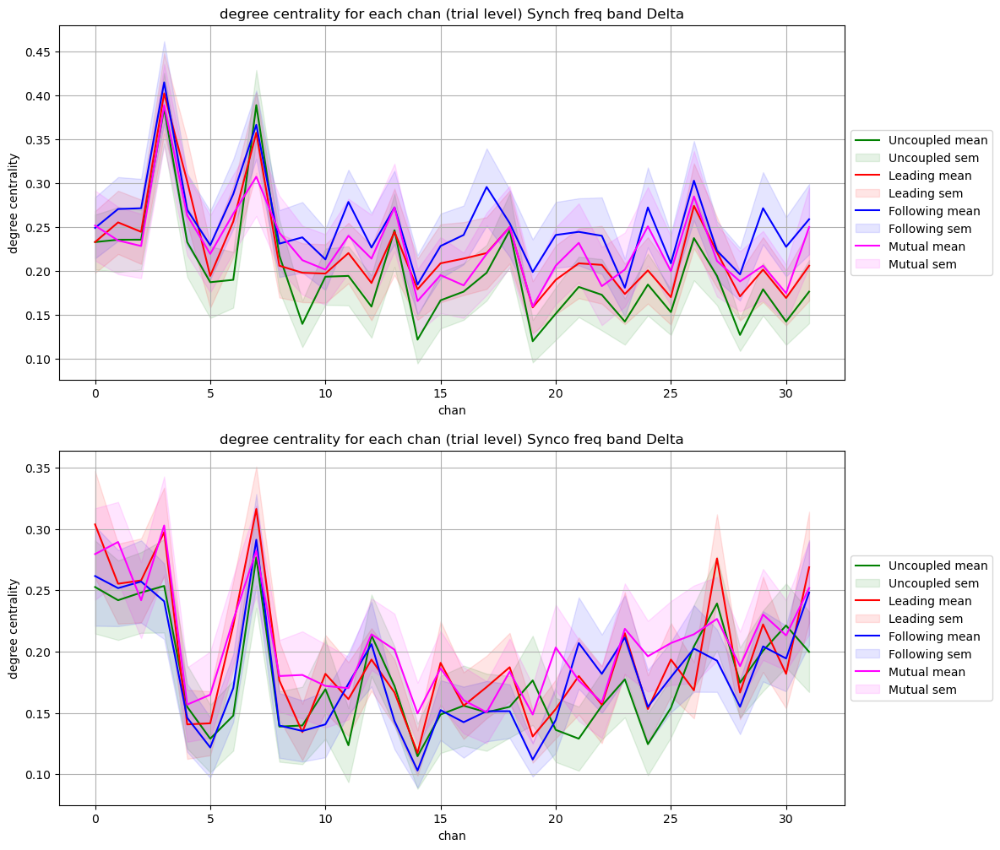

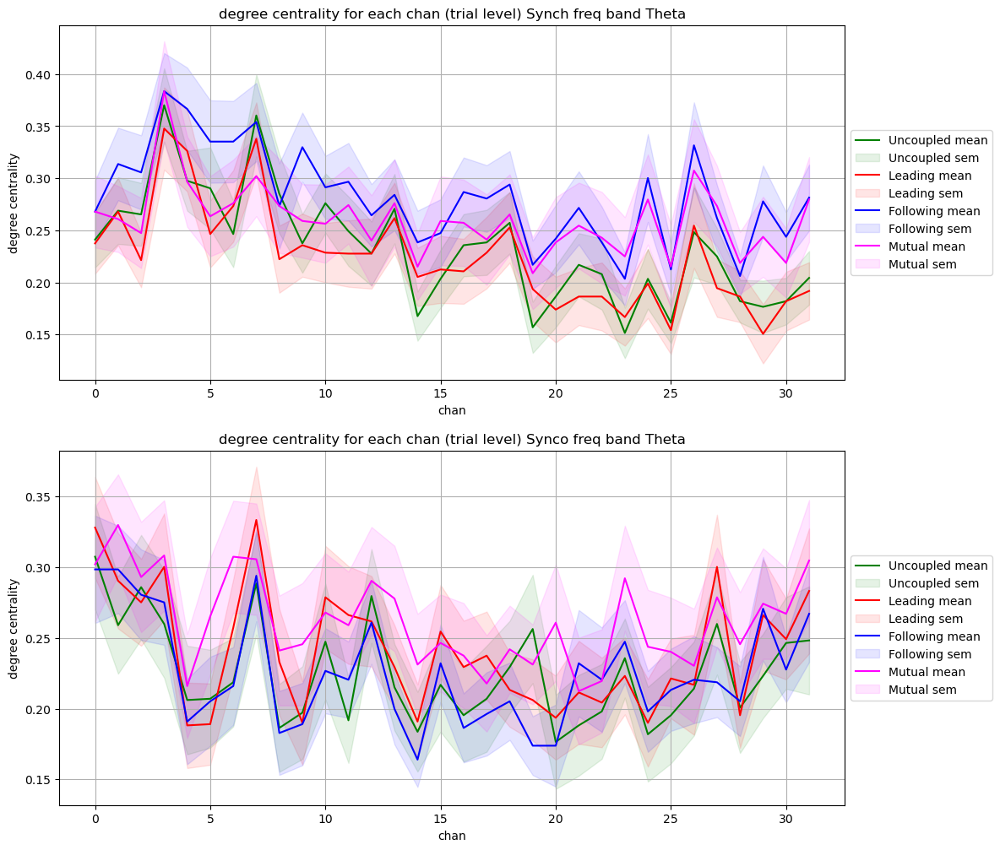

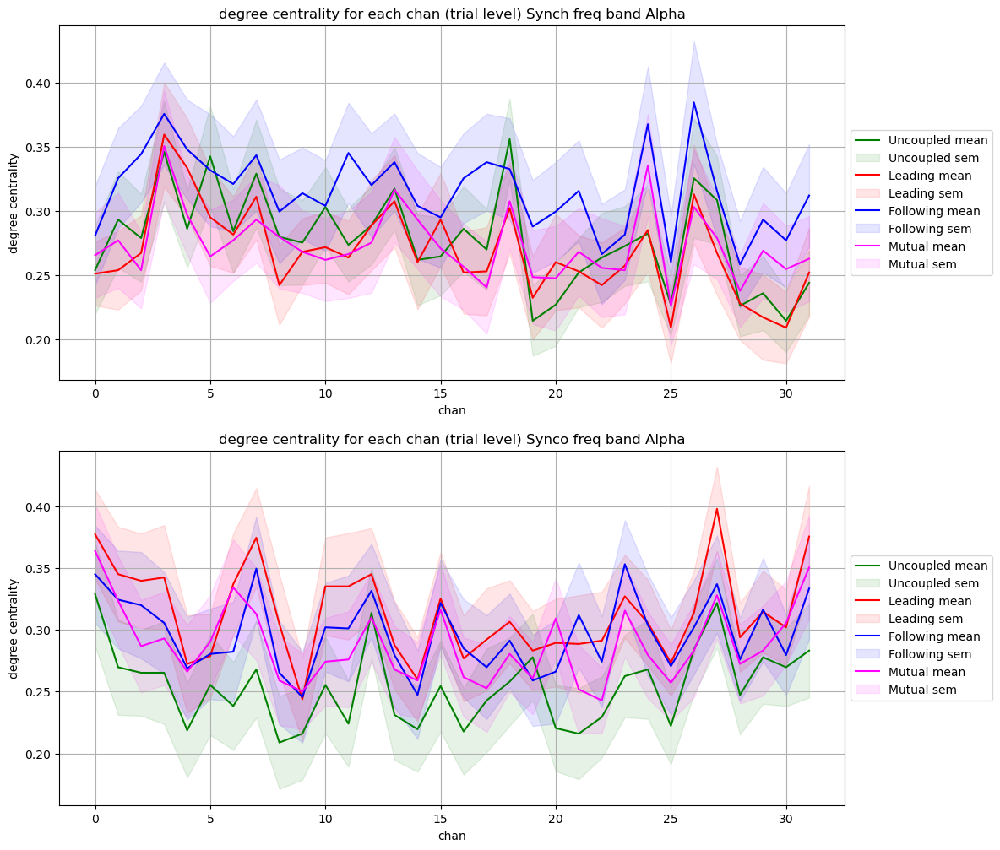

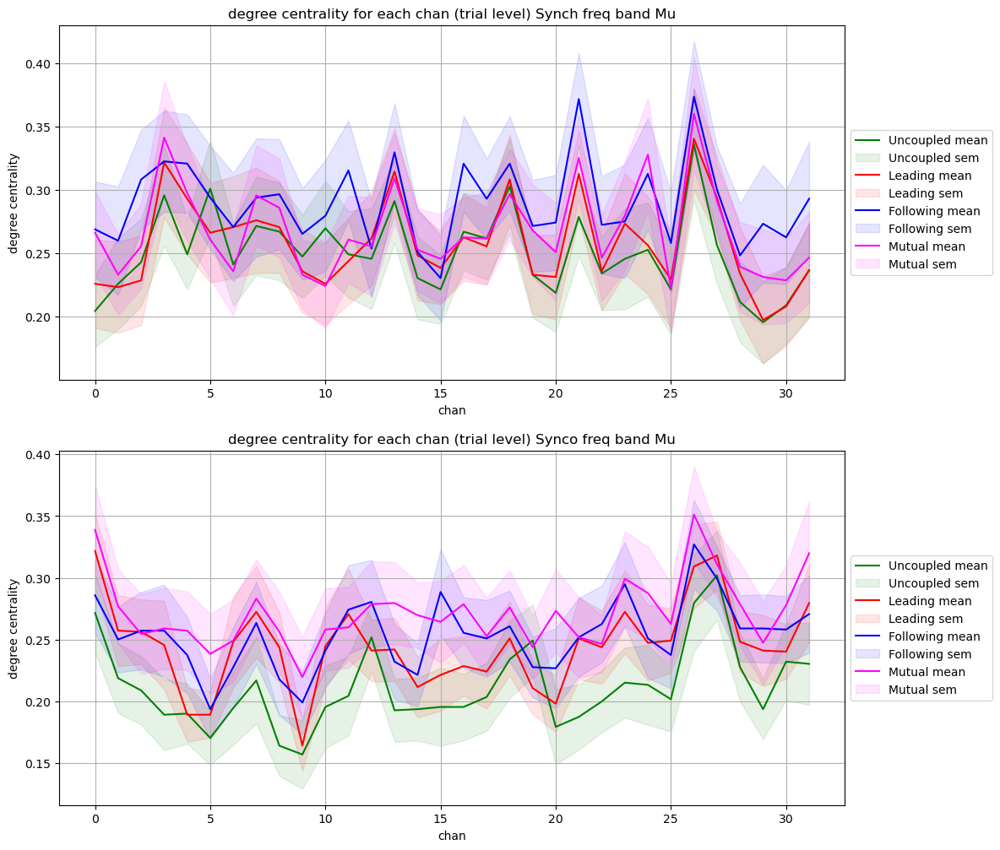

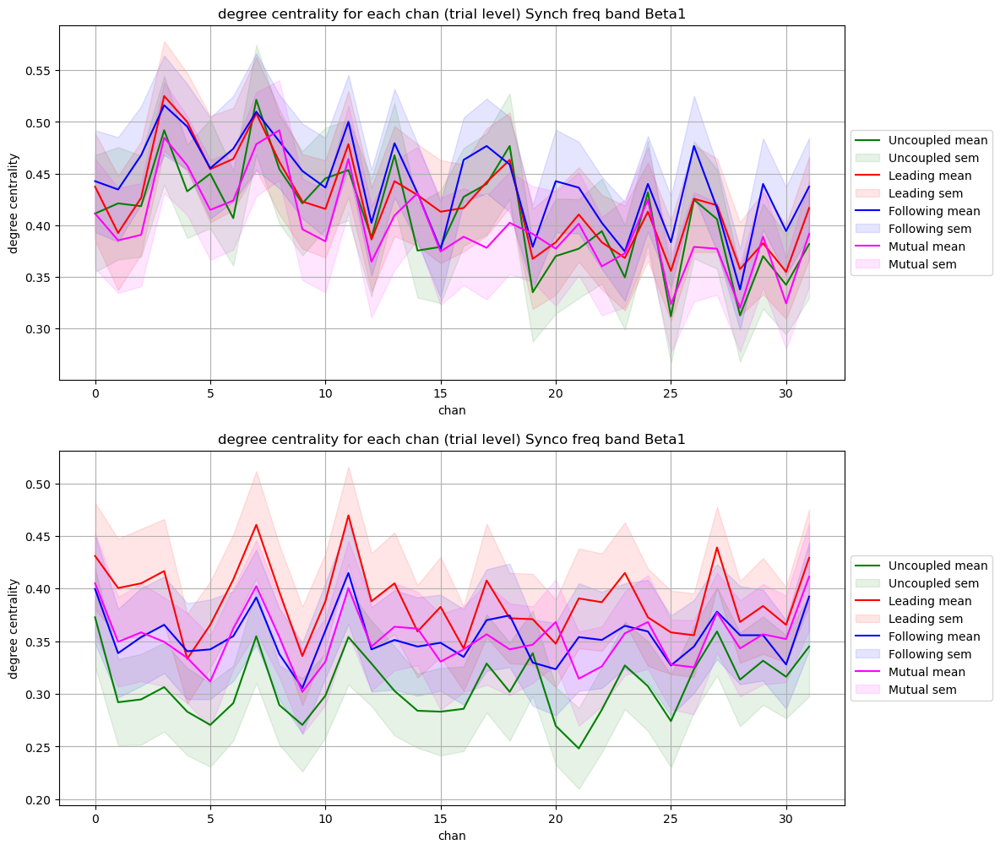

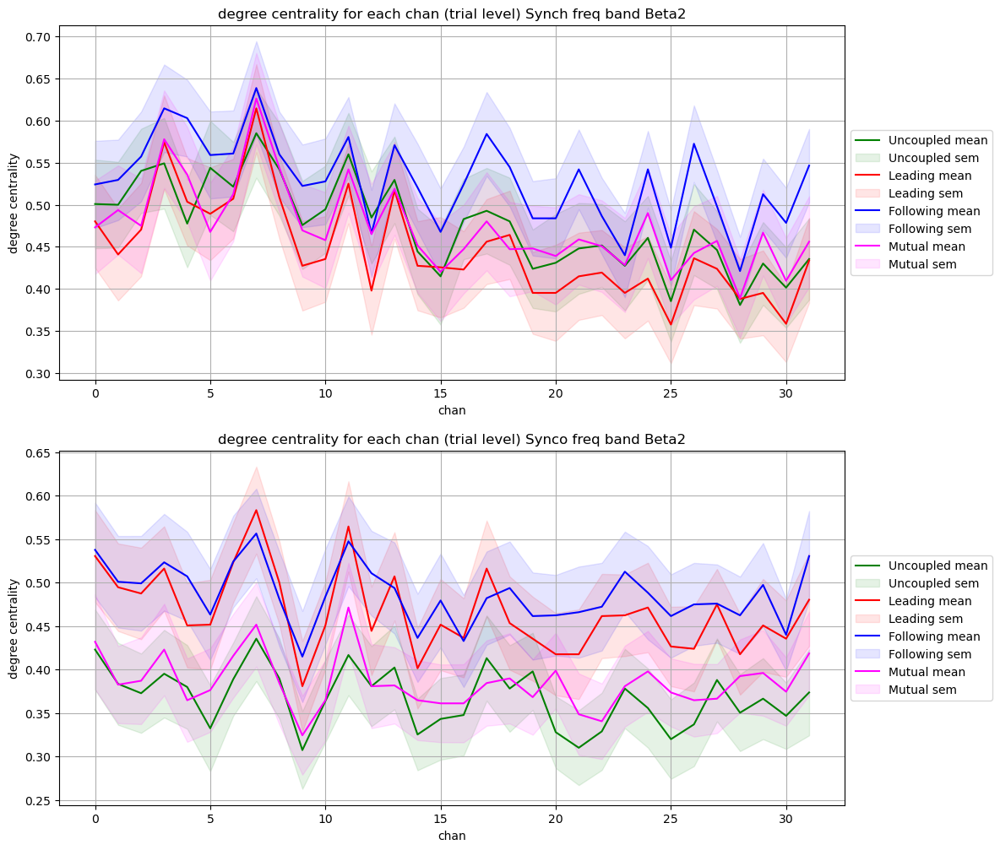

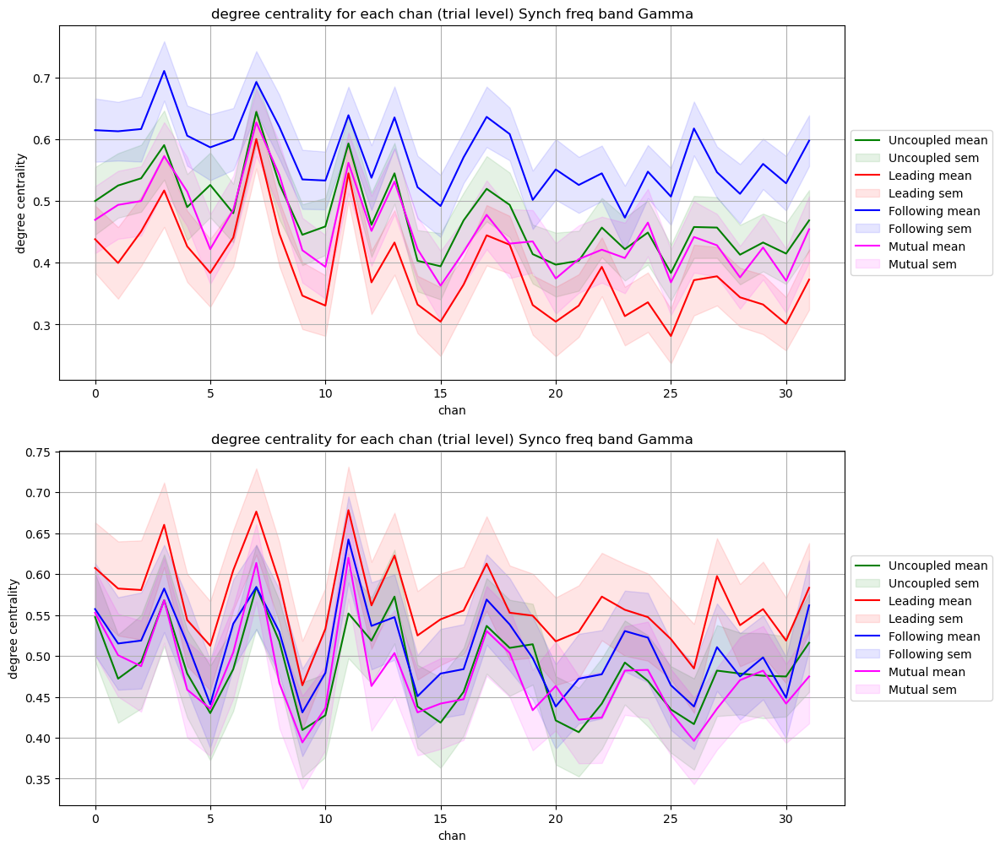

In [44]:
# plot mean centrality with sem
color_4st=['green','red','blue','black']
for freq in range(7):
    fig, ax = plt.subplots(2,1,figsize=(6*2, 6*2))
    for syn in range(2):
        plt.sca(ax[syn])
        for st in range(4):
            plt.plot (np.arange(32),eeg_pcorr_dgctr_mean2x4x7x32[syn,st,freq,:],color=condicolors[st])
            plt.fill_between(np.arange(32),eeg_pcorr_dgctr_mean2x4x7x32[syn,st,freq,:]-eeg_pcorr_dgctr_sem2x4x7x32[syn,st,freq,:],\
                            eeg_pcorr_dgctr_mean2x4x7x32[syn,st,freq,:]+eeg_pcorr_dgctr_sem2x4x7x32[syn,st,freq,:],\
                                color=condicolors[st], alpha=.1)

        plt.xlabel("chan")
        plt.ylabel("degree centrality")
        # plt.xlim(198,200)
        # plt.ylim(-0.17,-0.07)


        plt.title('degree centrality for each chan (trial level) '+syn2names[syn]+' freq band '+ band_labels[freq])
        plt.grid()

        plt.legend(['Uncoupled mean', 'Uncoupled sem', 'Leading mean', 'Leading sem',
            'Following mean', 'Following sem','Mutual mean','Mutual sem'],ncol=1,
            loc='center left', bbox_to_anchor=(1, 0.5))

In [45]:
# organze eeg_pcorr_dgctr into 2x4x7x32 # ((144,2,7,32)) # degree centrality (does not account for weight)

# mean and sem of degree centralities agreggating 32 channels  
eeg_pcorr_dgctr # 144x2x7x32
eeg_pcorr_dgctr_mean2x4x7=np.zeros((2,4,7)) # 2 syn types x 4 condi x 7 freq
eeg_pcorr_dgctr_sem2x4x7=np.zeros((2,4,7)) # 2 syn types x 4 condi x 7 freq

for freq in range(7):
    # Uncoupled
    mat1=eeg_pcorr_dgctr[Uncoupled_synch_ind,0,freq]
    mat2=eeg_pcorr_dgctr[Uncoupled_synch_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[0,0,freq],eeg_pcorr_dgctr_sem2x4x7[0,0,freq]=cal_mean_sem_aggre_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[Uncoupled_synco_ind,0,freq]
    mat2=eeg_pcorr_dgctr[Uncoupled_synco_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[1,0,freq],eeg_pcorr_dgctr_sem2x4x7[1,0,freq]=cal_mean_sem_aggre_chan(mat1,mat2)

    # Leading for L&R
    mat1=eeg_pcorr_dgctr[L_lead_synch_ind,0,freq]
    mat2=eeg_pcorr_dgctr[R_lead_synch_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[0,1,freq],eeg_pcorr_dgctr_sem2x4x7[0,1,freq]=cal_mean_sem_aggre_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[L_lead_synco_ind,0,freq]
    mat2=eeg_pcorr_dgctr[R_lead_synco_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[1,1,freq],eeg_pcorr_dgctr_sem2x4x7[1,1,freq]=cal_mean_sem_aggre_chan(mat1,mat2)

    # Following for L&R
    mat1=eeg_pcorr_dgctr[L_lead_synch_ind,1,freq]
    mat2=eeg_pcorr_dgctr[R_lead_synch_ind,0,freq]
    eeg_pcorr_dgctr_mean2x4x7[0,2,freq],eeg_pcorr_dgctr_sem2x4x7[0,2,freq]=cal_mean_sem_aggre_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[L_lead_synco_ind,1,freq]
    mat2=eeg_pcorr_dgctr[R_lead_synco_ind,0,freq]
    eeg_pcorr_dgctr_mean2x4x7[1,2,freq],eeg_pcorr_dgctr_sem2x4x7[1,2,freq]=cal_mean_sem_aggre_chan(mat1,mat2)

    # Mutual
    mat1=eeg_pcorr_dgctr[Mutual_synch_ind,0,freq]
    mat2=eeg_pcorr_dgctr[Mutual_synch_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[0,3,freq],eeg_pcorr_dgctr_sem2x4x7[0,3,freq]=cal_mean_sem_aggre_chan(mat1,mat2)
    mat1=eeg_pcorr_dgctr[Mutual_synco_ind,0,freq]
    mat2=eeg_pcorr_dgctr[Mutual_synco_ind,1,freq]
    eeg_pcorr_dgctr_mean2x4x7[1,3,freq],eeg_pcorr_dgctr_sem2x4x7[1,3,freq]=cal_mean_sem_aggre_chan(mat1,mat2)


In [47]:
np.shape(eeg_pcorr_dgctr_mean2x4x7)

(2, 4, 7)

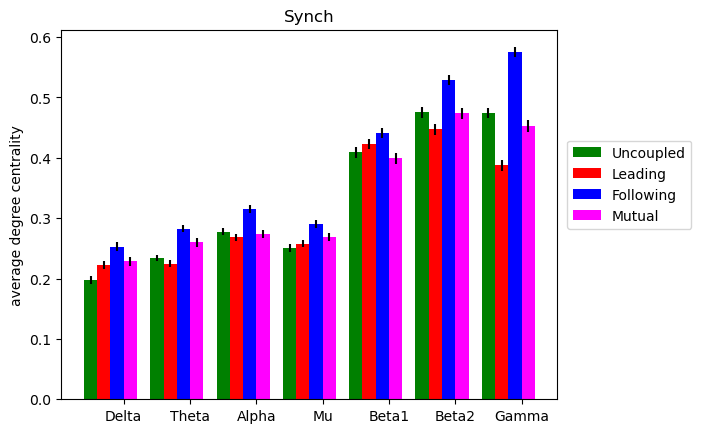

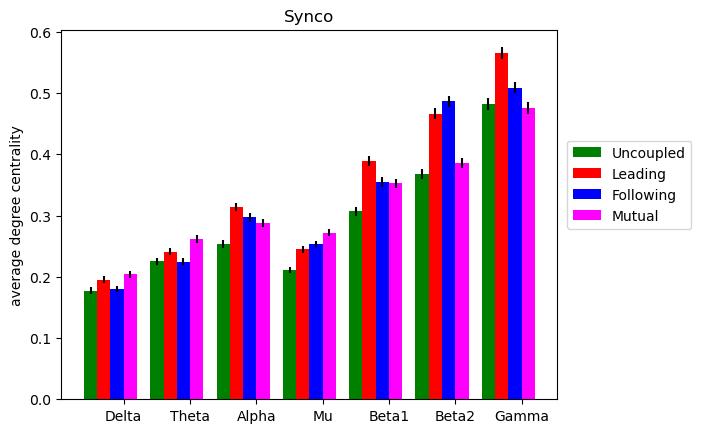

In [46]:
ind = np.arange(7)  # the x locations for the groups
width = 0.2  # the width of the bars

for syn in range(2):
    fig, ax = plt.subplots()
    for st in range(4):
        rects0 = ax.bar(ind + width*st, eeg_pcorr_dgctr_mean2x4x7[syn,st,:], width, yerr=eeg_pcorr_dgctr_sem2x4x7[syn,st,:],
                    label=states4names[st],color=condicolors[st])
    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('average degree centrality')
    ax.set_title(syn2names[syn])
    ax.set_xticks(ind+0.5)
    ax.set_xticklabels((band_labels))
    ax.legend(bbox_to_anchor=(1.02, 0.7), loc='upper left', borderaxespad=0)


In [48]:
# compute mean pcorr in 32x32 mat
eeg_partial_correlation144x2 # 144x2x7x32x32
eeg_pcorr_mean2x4x7=np.zeros((2,4,7,32,32)) # 2 syn types x 4 condi x 7 freq x 32 chan

for freq in range(7):
    # Uncoupled
    eeg_pcorr_mean2x4x7[0,0,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[Uncoupled_synch_ind,0,freq,:,:], \
                                            eeg_partial_correlation144x2[Uncoupled_synch_ind,1,freq,:,:]),axis=0),axis=0)
    eeg_pcorr_mean2x4x7[1,0,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[Uncoupled_synco_ind,0,freq,:,:], \
                                            eeg_partial_correlation144x2[Uncoupled_synco_ind,1,freq,:,:]),axis=0),axis=0)

    # Leading for L&R
    eeg_pcorr_mean2x4x7[0,1,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[L_lead_synch_ind,0,freq,:,:],\
                                            eeg_partial_correlation144x2[R_lead_synch_ind,1,freq,:,:]),axis=0),axis=0)
    eeg_pcorr_mean2x4x7[1,1,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[L_lead_synco_ind,0,freq,:,:],\
                                            eeg_partial_correlation144x2[R_lead_synco_ind,1,freq,:,:]),axis=0),axis=0)

    # Following for L&R
    eeg_pcorr_mean2x4x7[0,2,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[L_lead_synch_ind,1,freq,:,:],\
                                            eeg_partial_correlation144x2[R_lead_synch_ind,0,freq,:,:]),axis=0),axis=0)
    eeg_pcorr_mean2x4x7[1,2,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[L_lead_synco_ind,1,freq,:,:],\
                                            eeg_partial_correlation144x2[R_lead_synco_ind,0,freq,:,:]),axis=0),axis=0)

    # Mutual
    eeg_pcorr_mean2x4x7[0,3,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[Mutual_synch_ind,0,freq,:,:], \
                                            eeg_partial_correlation144x2[Mutual_synch_ind,1,freq,:,:]),axis=0),axis=0)
    eeg_pcorr_mean2x4x7[1,3,freq,:,:]=np.mean(np.concatenate((eeg_partial_correlation144x2[Mutual_synco_ind,0,freq,:,:], \
                                            eeg_partial_correlation144x2[Mutual_synco_ind,1,freq,:,:]),axis=0),axis=0)



In [49]:
# mat1=eeg_partial_correlation144x2[Uncoupled_synch_ind,0,freq,:,:]
# mat2=eeg_partial_correlation144x2[Uncoupled_synch_ind,1,freq,:,:]
def cal_mean_sem_all_edg(mat1,mat2):
    # this function compute the mean and se for each edge
    trl_pcorr=np.concatenate((mat1,mat2),axis=0)
    mean_trl_pcorr=np.mean(trl_pcorr,axis=0)
    sem_trl_pcorr=sem(trl_pcorr)
    # select the value from each edge and append them into one dimention
    mean_trl_pcorr_all_edg=list()
    sem_trl_pcorr_all_edg=list()
    for i in range(32):
        for j in range(32):
            if i<j: # use indicies to remove half of edges and colors and the diagonal
                mean_trl_pcorr_all_edg.append(mean_trl_pcorr[i,j])
                sem_trl_pcorr_all_edg.append(sem_trl_pcorr[i,j])
    return mean_trl_pcorr_all_edg, sem_trl_pcorr_all_edg


In [51]:
# mean and sem in 496 edges 
eeg_partial_correlation144x2 # 144x2x7x32x32
eeg_pcorr_edges_mean2x4x7=np.zeros((2,4,7,496)) # 2 syn types x 4 condi x 7 freq x 496 edges
eeg_pcorr_edges_sem2x4x7=np.zeros((2,4,7,496)) # 2 syn types x 4 condi x 7 freq x 496 edges

for freq in range(7):
    # Uncoupled
    mat1=eeg_partial_correlation144x2[Uncoupled_synch_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[Uncoupled_synch_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[0,0,freq,:],eeg_pcorr_edges_sem2x4x7[0,0,freq,:]=cal_mean_sem_all_edg(mat1,mat2)
    mat1=eeg_partial_correlation144x2[Uncoupled_synco_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[Uncoupled_synco_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[1,0,freq,:],eeg_pcorr_edges_sem2x4x7[1,0,freq,:]=cal_mean_sem_all_edg(mat1,mat2)

    # Leading for L&R
    mat1=eeg_partial_correlation144x2[L_lead_synch_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[R_lead_synch_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[0,1,freq,:],eeg_pcorr_edges_sem2x4x7[0,1,freq,:]=cal_mean_sem_all_edg(mat1,mat2)
    mat1=eeg_partial_correlation144x2[L_lead_synco_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[R_lead_synco_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[1,1,freq,:],eeg_pcorr_edges_sem2x4x7[1,1,freq,:]=cal_mean_sem_all_edg(mat1,mat2)

    # Following for L&R
    mat1=eeg_partial_correlation144x2[L_lead_synch_ind,1,freq,:,:]
    mat2=eeg_partial_correlation144x2[R_lead_synch_ind,0,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[0,2,freq,:],eeg_pcorr_edges_sem2x4x7[0,2,freq,:]=cal_mean_sem_all_edg(mat1,mat2)
    mat1=eeg_partial_correlation144x2[L_lead_synco_ind,1,freq,:,:]
    mat2=eeg_partial_correlation144x2[R_lead_synco_ind,0,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[1,2,freq,:],eeg_pcorr_edges_sem2x4x7[1,2,freq,:]=cal_mean_sem_all_edg(mat1,mat2)

    # Mutual
    mat1=eeg_partial_correlation144x2[Mutual_synch_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[Mutual_synch_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[0,3,freq,:],eeg_pcorr_edges_sem2x4x7[0,3,freq,:]=cal_mean_sem_all_edg(mat1,mat2)
    mat1=eeg_partial_correlation144x2[Mutual_synco_ind,0,freq,:,:]
    mat2=eeg_partial_correlation144x2[Mutual_synco_ind,1,freq,:,:]
    eeg_pcorr_edges_mean2x4x7[1,3,freq,:],eeg_pcorr_edges_sem2x4x7[1,3,freq,:]=cal_mean_sem_all_edg(mat1,mat2)



In [ ]:
str(channel_labels[edges_list[199][0]])+'_____'+str(channel_labels[edges_list[199][1]])

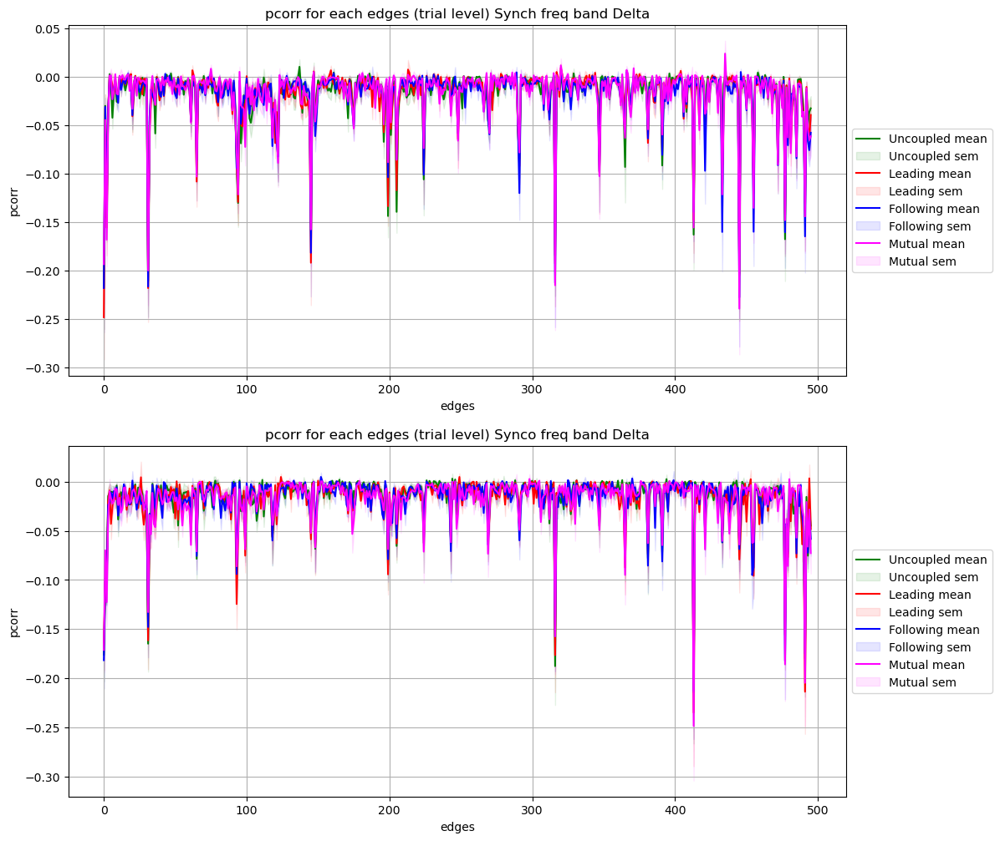

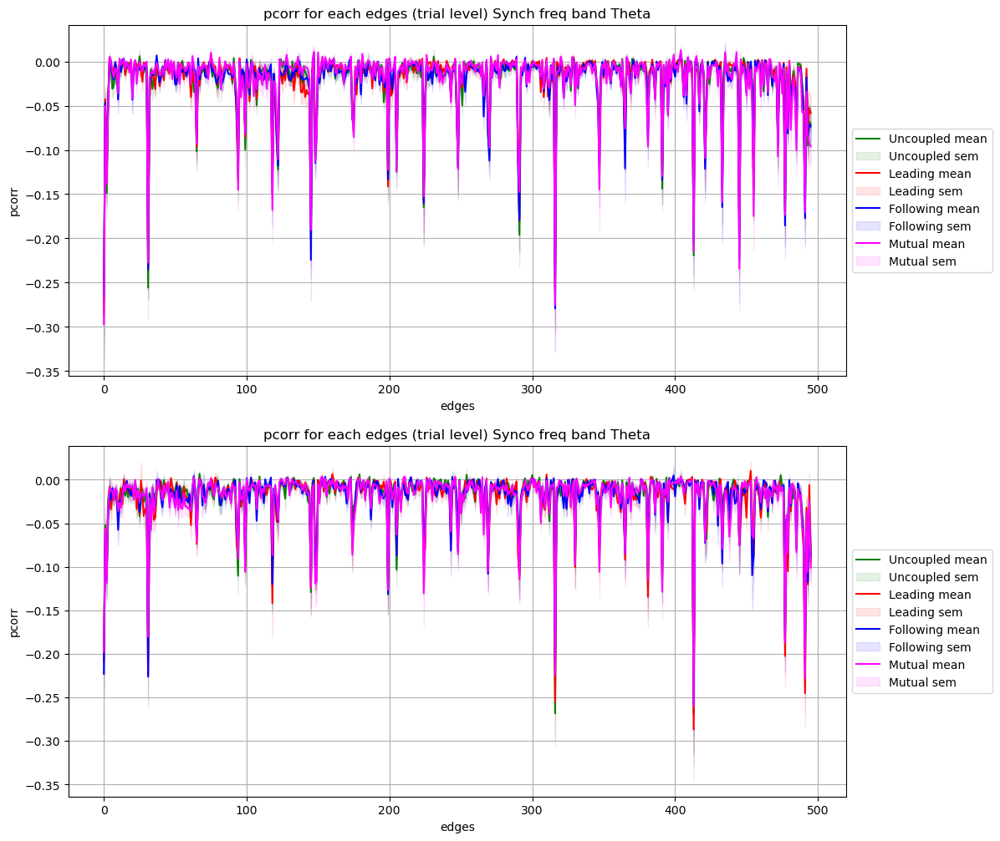

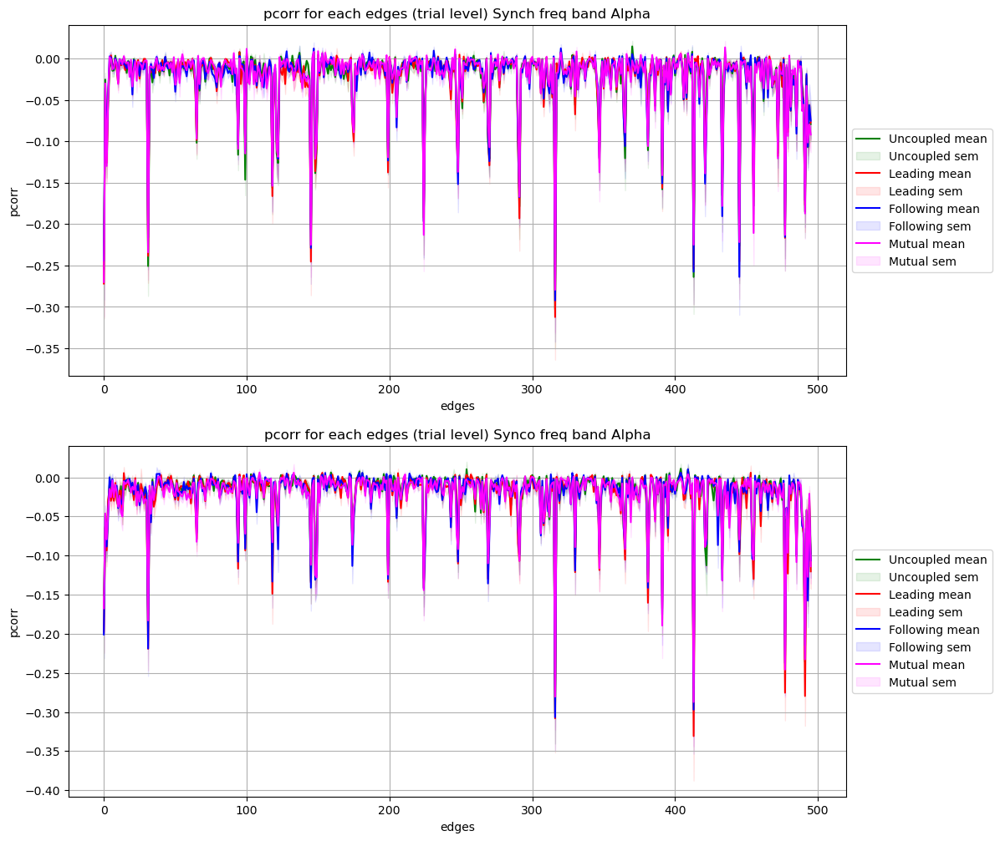

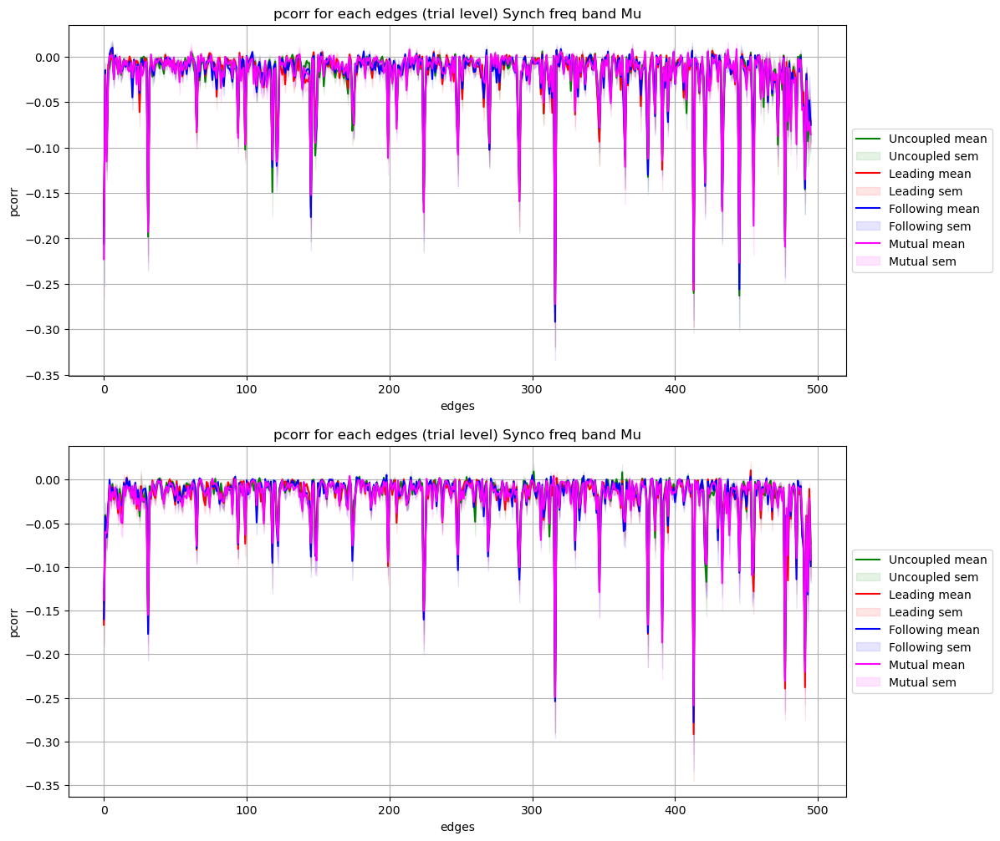

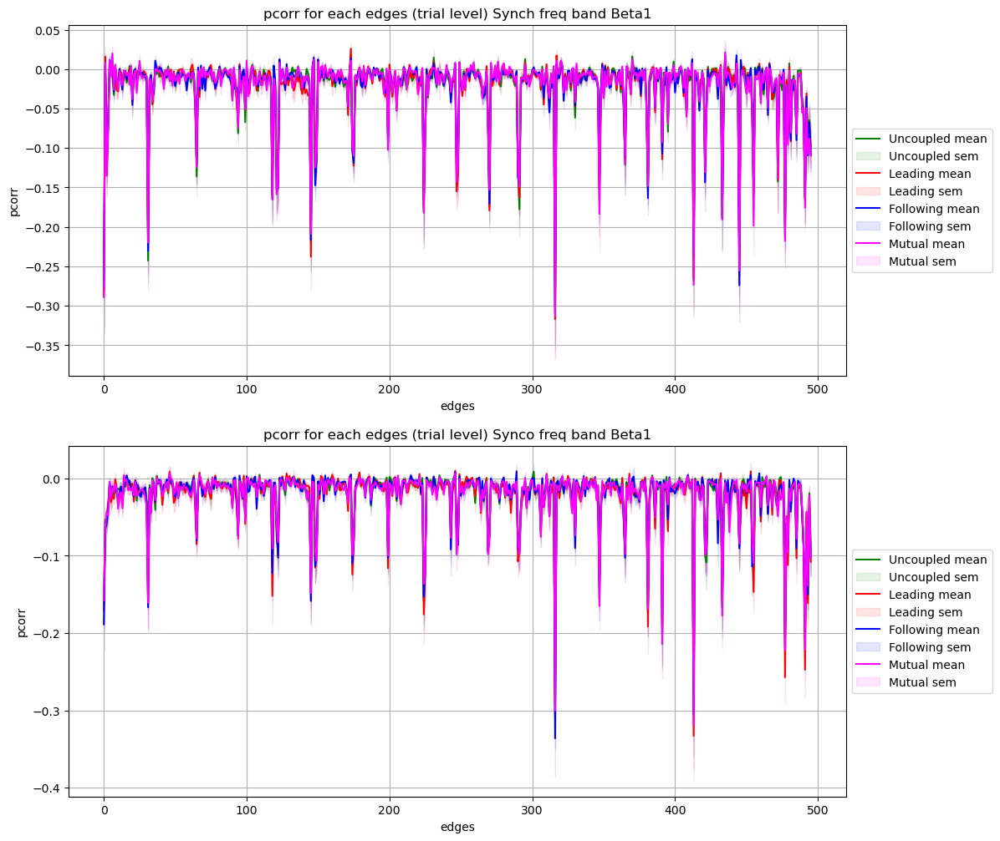

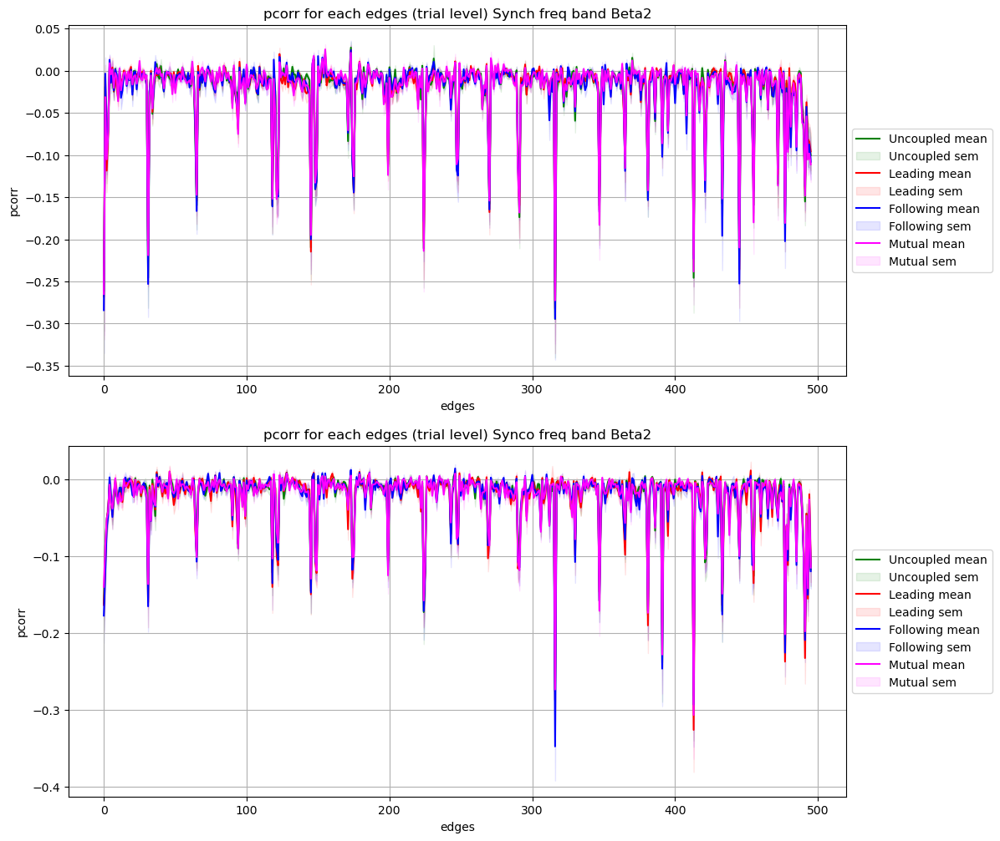

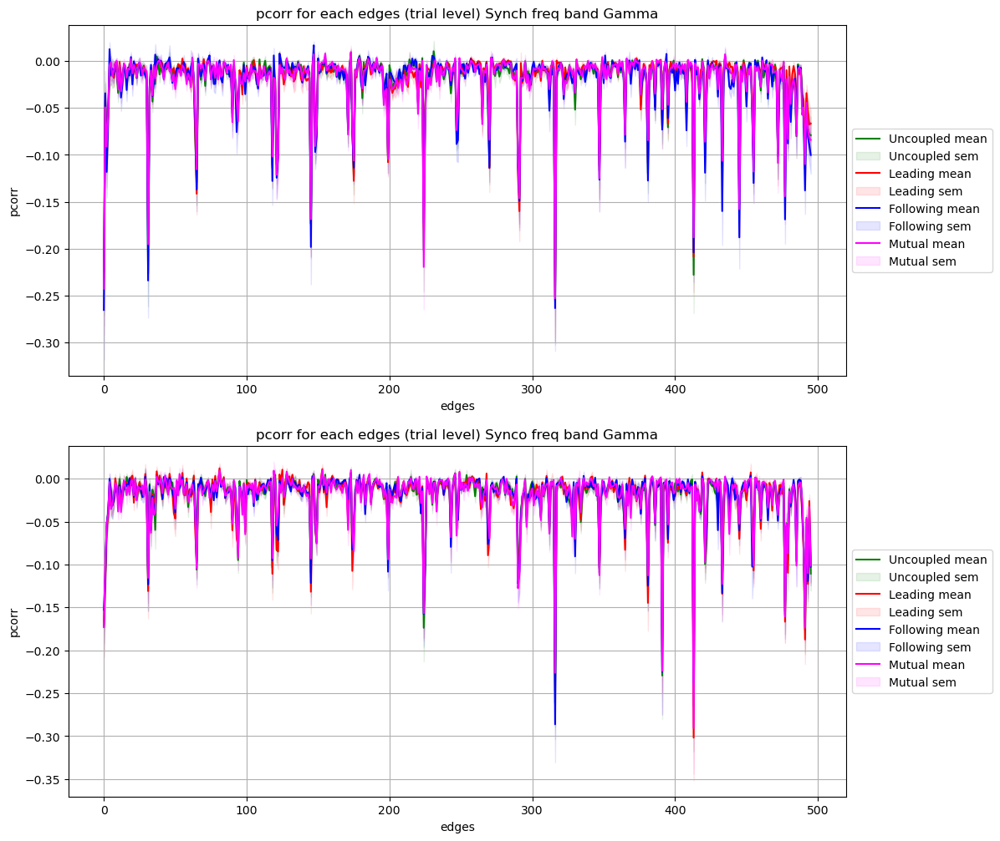

In [52]:
# plot number of edges with sem
color_4st=['green','red','blue','black']
for freq in range(7):
    fig, ax = plt.subplots(2,1,figsize=(6*2, 6*2))
    for syn in range(2):
        plt.sca(ax[syn])
        for st in range(4):
            plt.plot (np.arange(496),eeg_pcorr_edges_mean2x4x7[syn,st,freq,:],color=condicolors[st])
            plt.fill_between(np.arange(496),eeg_pcorr_edges_mean2x4x7[syn,st,freq,:]-eeg_pcorr_edges_sem2x4x7[syn,st,freq,:],\
                            eeg_pcorr_edges_mean2x4x7[syn,st,freq,:]+eeg_pcorr_edges_sem2x4x7[syn,st,freq,:],\
                                color=condicolors[st], alpha=.1)

        plt.xlabel("edges")
        plt.ylabel("pcorr")
        # plt.xlim(198,200)
        # plt.ylim(-0.17,-0.07)


        plt.title('pcorr for each edges (trial level) '+syn2names[syn]+' freq band '+ band_labels[freq])
        plt.grid()

        plt.legend(['Uncoupled mean', 'Uncoupled sem', 'Leading mean', 'Leading sem',
            'Following mean', 'Following sem','Mutual mean','Mutual sem'],ncol=1,
            loc='center left', bbox_to_anchor=(1, 0.5))

In [ ]:
# select a freq band to investigate
for freq in range(7): # alpha and gamma
        fig, ax = plt.subplots(2,4,figsize=(6*4+3, 6*2))

        for syn in range(2):
                for condi in range(4):
                        
                        weights=np.abs(eeg_pcorr_edges_mean2x4x7[syn,condi,freq,:])
                        non0_edges=list()
                        for i in range(len(edges_list)): # 496
                                if weights[i] != 0:
                                        non0_edges.append(edges_list[i]+({'weight': weights[i]},))
                        # networkx initiate with edges
                        X = nx.Graph()
                        X.add_edges_from(non0_edges)
                        edges,non0_weights = zip(*nx.get_edge_attributes(X,'weight').items())

                        centrality = nx.current_flow_betweenness_centrality(X, weight='weight')
                        node_colors=[n for n in centrality.values()]

                        # set colorbar limits for node and edge from the 1st subplot
                        if syn==0 and condi ==0:
                                vmin_node_c=min(node_colors)#+0.9*(max(node_colors)-min(node_colors))
                                vmax_node_c=max(node_colors)#-0.45*(max(node_colors)-min(node_colors))
                                vmin_edge_c=0 #min(weights) +0.01*(max(weights)-min(weights))
                                vmax_edge_c=0.2 #max(weights) -0.7*(max(weights)-min(weights))
                        
                        # subplot
                        plt.sca(ax[syn, condi])

                        nx.draw_networkx_labels(X, pos, labels=labeldict, font_size=10)

                        nodes=nx.draw_networkx_nodes(X, pos, node_size=500, 
                                node_color=node_colors, vmin=vmin_node_c, vmax=vmax_node_c, 
                                cmap='Greens', alpha=0.9)

                        edges=nx.draw_networkx_edges(X, pos, width=2, 
                                edge_color=non0_weights,edge_vmin=vmin_edge_c,edge_vmax=vmax_edge_c,
                                edge_cmap=plt.cm.Reds,alpha=0.5)
                        
                        ax[syn, condi].set_title(syn2names[syn] + ' ' + states4names[condi],
                                                fontsize = 20) 
                        ax[syn, condi].axis('off')


        fig.subplots_adjust(right=0.8)
        cbar_ax1 = fig.add_axes([0.83, 0.15, 0.01, 0.7])
        cbar_ax2 = fig.add_axes([0.88, 0.15, 0.01, 0.7])

        cbar_node=fig.colorbar(nodes,cbar_ax1)
        cbar_node.ax.tick_params(labelsize=10)
        cbar_node.set_label('current_flow_betweenness_centrality',fontsize = 15)

        cbar_edges=fig.colorbar(edges,cbar_ax2)
        cbar_edges.ax.tick_params(labelsize=10)
        cbar_edges.set_label('average pcorr',fontsize = 15)

        fig.subplots_adjust(top=0.85)
        fig.suptitle('Frequency band:  '+band_labels[freq], fontsize = 20) 



organize behaviral H into 144 x 2

In [ ]:
# load data of the 4 states
outdict=loadmat('H_all.mat')
H_all=outdict["H_all"]      # 2x12x12


In [ ]:
# put H_all into 144 first dimention
H144=np.zeros((144,2))
n=0
for ses in range(12):
    for trl in range(12):
        H144[n,0]=H_all[0,ses,trl]
        H144[n,1]=H_all[1,ses,trl]
        n+=1


In [ ]:
outdict = dict()
outdict['H144'] = H144
savemat('H144',outdict,store_python_metadata = True) 

comparing conditions

In [ ]:
# condition_index144 
H_means=np.zeros((2,4))
H_sems=np.zeros((2,4))

# Uncoupled
H_means[0,0]=np.mean(H144[Uncoupled_synch_ind,:])
H_means[1,0]=np.mean(H144[Uncoupled_synco_ind,:])

# Leading for L&R
H_means[0,1]=np.mean(np.concatenate((H144[L_lead_synch_ind,0],H144[R_lead_synch_ind,1])))
H_means[1,1]=np.mean(np.concatenate((H144[L_lead_synco_ind,0],H144[R_lead_synco_ind,1])))

# Following for L&R
H_means[0,2]=np.mean(np.concatenate((H144[L_lead_synch_ind,1],H144[R_lead_synch_ind,0])))
H_means[1,2]=np.mean(np.concatenate((H144[L_lead_synco_ind,1],H144[R_lead_synco_ind,0])))

# Mutual
H_means[0,3]=np.mean(H144[Mutual_synch_ind,:])
H_means[1,3]=np.mean(H144[Mutual_synco_ind,:])

# ***********************************************************************************

# Uncoupled
H_sems[0,0]=sem(H144[Uncoupled_synch_ind,:],axis=None)
H_sems[1,0]=sem(H144[Uncoupled_synco_ind,:],axis=None)

# Leading for L&R
H_sems[0,1]=sem(np.concatenate((H144[L_lead_synch_ind,0],H144[R_lead_synch_ind,1])))
H_sems[1,1]=sem(np.concatenate((H144[L_lead_synco_ind,0],H144[R_lead_synco_ind,1])))

# Following for L&R
H_sems[0,2]=sem(np.concatenate((H144[L_lead_synch_ind,1],H144[R_lead_synch_ind,0])))
H_sems[1,2]=sem(np.concatenate((H144[L_lead_synco_ind,1],H144[R_lead_synco_ind,0])))

# Mutual
H_sems[0,3]=sem(H144[Mutual_synch_ind,:],axis=None)
H_sems[1,3]=sem(H144[Mutual_synco_ind,:],axis=None)

In [ ]:

synch_means, synch_sem = H_means[0,:], H_sems[0,:]
synco_means, synco_sem = H_means[1,:], H_sems[1,:]

ind = np.arange(len(synch_means))  # the x locations for the groups
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(ind - width/2, synch_means, width, yerr=synch_sem,
                label='Synch')
rects2 = ax.bar(ind + width/2, synco_means, width, yerr=synco_sem,
                label='Synco')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('H')
ax.set_title('H by condi and syn type')
ax.set_xticks(ind)
ax.set_xticklabels(states4names)
ax.legend()

plt.ylim(0.6, 0.85)

fig.tight_layout()

plt.show()

In [ ]:
def polyfit_plotline(x,y,color_array,label_name):
    plt.plot(x,y,'.', color=color_array)
    A = np.polyfit(x, y, 1)
    Alpha1 = A[0]
    FitValues = np.polyval(A, x)
    RHO = np.corrcoef(x, y)
    RHO = RHO[0,1]
    plt.plot(x, FitValues, '-', color=color_array, linewidth=3,label=label_name)
    plt.text(min(x), min(FitValues)+0.025, '$\\rho$ = '+str(round(RHO,2)), color=color_array, fontsize=15)  
    plt.xlim(0.2,1.4)
    plt.ylim(0.2,1.4)
    
    

In [ ]:
# pair subjects to match H in 3 states
fig, ax = plt.subplots(1,3,figsize=(6*3, 6*1))
plt.sca(ax[0])
polyfit_plotline(H144[Uncoupled_synch_ind,0],H144[Uncoupled_synch_ind,1],syn2colors[0],'synch')
polyfit_plotline(H144[Uncoupled_synco_ind,0],H144[Uncoupled_synco_ind,1],syn2colors[1],'synco')
plt.legend()

plt.sca(ax[1])
polyfit_plotline(np.concatenate((H144[L_lead_synch_ind,0],H144[R_lead_synch_ind,1])),\
                 np.concatenate((H144[L_lead_synch_ind,1],H144[R_lead_synch_ind,0])),syn2colors[0],'synch')
polyfit_plotline(np.concatenate((H144[L_lead_synco_ind,0],H144[R_lead_synco_ind,1])),\
                 np.concatenate((H144[L_lead_synco_ind,1],H144[R_lead_synco_ind,0])),syn2colors[1],'synco')
plt.legend()

plt.sca(ax[2])
polyfit_plotline(H144[Mutual_synch_ind,0],H144[Mutual_synch_ind,1],syn2colors[0],'synch')
polyfit_plotline(H144[Mutual_synco_ind,0],H144[Mutual_synco_ind,1],syn2colors[1],'synco')
plt.legend()

In [ ]:
np.concatenate((H144[L_lead_synch_ind,0],H144[R_lead_synch_ind,1]))